# Utility Smoothing in RUMBoost

Given RUMBoost produces piecewise-constant utility values for each attribute due to the nature of tree ensembles, to obtain smooth, interpretable utility functions (with well-defined gradients like marginal utilities and Value of Time),  various post hoc smoothing techniques are applied. In this notebook, these smoothing methods are demonstrated:

Piecewise-Cubic Utility Functions (PCUF) – the original optimisation-based smoothing method fits monotonic piecewise cubic splines to the utility values​

PCUF with Adaptive Knots

LOESS Smoothing – Locally Estimated Scatterplot Smoothing (a localised regression approach) with an added isotonic regression step to enforce monotonicity.

Moving Average Smoothing – A simple moving window average (including an adaptive window variant) with monotonicity enforcement via isotonic regression.

Gaussian Kernel Smoothing – Weighted averaging with a Gaussian kernel and endpoint adjustments to smooth the utility with monotonicity enforcement via isotonic regression.

Monotonic I-Spline Smoothing – Fitting monotonic spline functions (I-splines) via least squares with inequality constraints.


In [2]:
import sys

sys.path.append("../")

In [3]:
%load_ext autoreload
%autoreload 2

In [5]:
from rumboost.rumboost import rum_train
from rumboost.datasets import load_preprocess_LPMC
from rumboost.metrics import cross_entropy
from rumboost.utility_smoothing import optimal_knots_position, map_x_knots, smooth_predict, updated_utility_collection
from rumboost.utility_plotting import plot_spline, weights_to_plot_v2, plot_VoT, plot_pop_VoT

import lightgbm
import numpy as np
import hyperopt

In [6]:
#load dataset
LPMC_train, LPMC_test, folds = load_preprocess_LPMC(path="../Data/")

### Training of a RUMBoost model

As smoothing is a post-processing tool, we first need to train a RUMBoost model. Therefore, we train the final model from the example simple_rumboost.

In [7]:
# parameters
general_params = {
    "n_jobs": -1,
    "num_classes": 4,  # important
    "verbosity": 1,  # specific RUMBoost parameter
    "num_iterations": 1276,
}

In [8]:
rum_structure = [
    {
        "utility": [0],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_walking",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
            ],
        },
        "shared": False,
    },
    {
        "utility": [1],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_cycling",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
            ],
        },
        "shared": False,
    },
    {
        "utility": [2],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_pt_access",
            "dur_pt_bus",
            "dur_pt_rail",
            "dur_pt_int_waiting",
            "dur_pt_int_walking",
            "pt_n_interchanges",
            "cost_transit",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
                -1,
                -1,
                -1,
                -1,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
                [17],
                [18],
                [19],
                [20],
                [21],
                [22],
            ],
        },
        "shared": False,
    },
    {
        "utility": [3],
        "variables": [
            "age",
            "female",
            "day_of_week",
            "start_time_linear",
            "car_ownership",
            "driving_license",
            "purpose_B",
            "purpose_HBE",
            "purpose_HBO",
            "purpose_HBW",
            "purpose_NHBO",
            "fueltype_Average",
            "fueltype_Diesel",
            "fueltype_Hybrid",
            "fueltype_Petrol",
            "distance",
            "dur_driving",
            "cost_driving_fuel",
            "congestion_charge",
            "driving_traffic_percent",
        ],
        "boosting_params": {
            "monotone_constraints_method": "advanced",
            "max_depth": 1,
            "n_jobs": -1,
            "learning_rate": 0.1,
            "monotone_constraints": [
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                0,
                -1,
                -1,
                -1,
                -1,
                -1,
            ],
            "interaction_constraints": [
                [0],
                [1],
                [2],
                [3],
                [4],
                [5],
                [6],
                [7],
                [8],
                [9],
                [10],
                [11],
                [12],
                [13],
                [14],
                [15],
                [16],
                [17],
                [18],
                [19],
            ],
        },
        "shared": False,
    },
]

In [9]:
model_specification = {
    "general_params": general_params,
    "rum_structure": rum_structure,
}

In [10]:
# features and label column names
features = [f for f in LPMC_train.columns if f != "choice"]
label = "choice"

# create lightgbm dataset
lgb_train_set = lightgbm.Dataset(
    LPMC_train[features], label=LPMC_train[label], free_raw_data=False
)
lgb_test_set = lightgbm.Dataset(
    LPMC_test[features], label=LPMC_test[label], free_raw_data=False
)

In [11]:
#train the model
LPMC_model_fully_trained = rum_train(lgb_train_set, model_specification)

#predicts classes on test set
preds = LPMC_model_fully_trained.predict(lgb_test_set)

#compute cross entropy on the test set
ce_test = cross_entropy(preds, lgb_test_set.get_label().astype(int))

print('-'*50)
print(f'Final negative cross-entropy on the test set: {ce_test}')

/Users/leovilardo/rumboost/examples/../rumboost/rumboost.py:1917: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 854
[LightGBM] [Info] Number of data points in the train set: 54766, number of used features: 17
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 854
[LightGBM] [Info] Number of data points in the train set: 54766, number of used features: 17
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1834
[LightGBM] [Info] Number of

### Hyperparameter search: optimal number of knots

The optimal number of knots is found with hyperopt. For computational purposes we show here only one iteration, but we ran that code with 25 iterations for the paper. Given a number of knots, the optimal positions of knots can be found with the ```optimal_knots_position()``` function.

**The basic settings for functions smoothing are**:

- First and last knots fixed
- Optimisation of the BIC
- Optimisation of the postion with scipy.minimize

In [80]:
param_space = {'0':{'distance': hyperopt.pyll.scope.int(hyperopt.hp.quniform('distance_0', 3, 7,1)),
                    'dur_walking': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_walking', 3, 7,1))},
            '1':{'distance': hyperopt.pyll.scope.int(hyperopt.hp.quniform('distance_1', 3, 7,1)),
                    'dur_cycling': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_cycling', 3, 7,1))},
            '2':{'cost_transit': hyperopt.pyll.scope.int(hyperopt.hp.quniform('cost_transit', 3, 7,1)),
                    #'distance': hyperopt.pyll.scope.int(hyperopt.hp.quniform('distance_2', 3, 7,1)),
                    'dur_pt_access': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_pt_access', 3, 7,1)),
                    'dur_pt_bus': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_pt_bus', 3, 7,1)),
                    'dur_pt_int_waiting': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_pt_int_waiting', 3, 7,1)),
                    'dur_pt_int_walking': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_pt_int_walking', 3, 7,1)),
                    'dur_pt_rail': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_pt_rail', 3, 7,1))},
            '3':{'cost_driving_fuel': hyperopt.pyll.scope.int(hyperopt.hp.quniform('cost_driving_fuel', 3, 7,1)),
                    'distance': hyperopt.pyll.scope.int(hyperopt.hp.quniform('distance_3', 3, 7,1)),
                    'driving_traffic_percent': hyperopt.pyll.scope.int(hyperopt.hp.quniform('driving_traffic_percent', 3, 7,1)),
                    'dur_driving': hyperopt.pyll.scope.int(hyperopt.hp.quniform('dur_driving', 3, 7,1))}
                }

#optimal number of splines (number of knots-1)
#param_space = {'0':{'distance': 5,
#                    'dur_walking': 5},
#            '1':{'distance': 5,
#                    'dur_cycling': 6},
#            '2':{'cost_transit': 3,
#                    #'distance': 5,
#                    'dur_pt_access': 3,
#                    'dur_pt_bus': 3,
#                    'dur_pt_int_waiting': 7,
#                    'dur_pt_int_walking': 6,
#                    'dur_pt_rail': 3},
#            '3':{'cost_driving_fuel': 5,
#                    'distance': 3,
#                    'driving_traffic_percent': 7,
#                    'dur_driving': 4}
#                }

Optimisation of knots position for hyperopt

In [81]:
def objective(space):
    dataset_train, _, _ = load_preprocess_LPMC(path="../Data/")
        
    weights = weights_to_plot_v2(LPMC_model_fully_trained)

    spline_utilities = {'0':['distance', 'dur_walking'],'1':['distance', 'dur_cycling'], '2':['distance', 'dur_pt_rail', 'dur_pt_bus', 'cost_transit', 'dur_pt_access', 'dur_pt_int_walking', 'dur_pt_int_waiting'], '3': ['distance', 'dur_driving','cost_driving_fuel', 'driving_traffic_percent']}

    target = 'choice'

    spline_collection = space

    x_opt, x_first, x_last, loss = optimal_knots_position(weights, dataset_train, dataset_train, dataset_train[target], spline_utilities, spline_collection, max_iter = 200, optimise = True, n_iter=1, first_last_knot_fixed=True)

    return {'loss': loss, 'x_opt':x_opt.x, 'status': hyperopt.STATUS_OK, 'x_first': x_first, 'x_last': x_last}

# n=25
n=1
trials = hyperopt.Trials()
best_classifier = hyperopt.fmin(fn=objective,
                                space=param_space,
                                algo=hyperopt.tpe.suggest,
                                max_evals=n,
                                trials=trials)

best_classifier['_best_loss'] = trials.best_trial['result']['loss']
best_classifier['_x_opt'] = trials.best_trial['result']['x_opt']
best_classifier['_x_first'] = trials.best_trial['result']['x_first']
best_classifier['_x_last'] = trials.best_trial['result']['x_last']

  0%|          | 0/1 [00:00<?, ?trial/s, best loss=?]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/scipy/optimize/_optimize.py:353: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  warnings.warn("Values in x were outside bounds during a "



Inequality constraints incompatible    (Exit mode 4) 
            Current function value:                  
71949.05367829786                                    
            Iterations:                              
57                                                   
            Function evaluations:                    
2780                                                 
            Gradient evaluations:                    
53                                                   
1/1:71949.05367829786 with knots at: [ 2.33591756  9.10084859 16.23282813  0.42430554  2.42058795  2.82941358
  3.34245127  4.81164411  1.390064    2.75421947 10.20630181 13.56880238
 19.30151704  0.52048712  1.7042409   2.79496368  6.40829427  0.29057175
  0.37635022  0.53766691  0.46596675  0.61985177  0.74217288  1.00929223
  0.08594878  0.21883883  0.33257787  0.02258284  0.05329087  0.11141184
  0.22323688  0.49143701  1.01434385  2.96920051  4.57993667  5.97785842
  6.1972957  10.95977639 16.65276111  0

# PCUF (original)

## Testing on out-of-sample data

Given the optimal knot position, we can validate our approach by computing the cross entropy loss on out-of-sample data. 
This can vary from the value displayed in the paper due to randomness in the optimisation solver

In [82]:
weights = weights_to_plot_v2(LPMC_model_fully_trained)

spline_collection = {'0':{'distance': int(best_classifier['distance_0']),
                    'dur_walking': int(best_classifier['dur_walking'])},
            '1':{'distance': int(best_classifier['distance_1']),
                    'dur_cycling': int(best_classifier['dur_cycling'])},
            '2':{'cost_transit': int(best_classifier['cost_transit']),
                    #'distance': int(best_classifier['distance_2']),
                    'dur_pt_access': int(best_classifier['dur_pt_access']),
                    'dur_pt_bus': int(best_classifier['dur_pt_bus']),
                    'dur_pt_int_waiting': int(best_classifier['dur_pt_int_waiting']),
                    'dur_pt_int_walking': int(best_classifier['dur_pt_int_walking']),
                    'dur_pt_rail': int(best_classifier['dur_pt_rail'])},
            '3':{'cost_driving_fuel': int(best_classifier['cost_driving_fuel']),
                    'distance': int(best_classifier['distance_3']),
                    'driving_traffic_percent': int(best_classifier['driving_traffic_percent']),
                    'dur_driving': int(best_classifier['dur_driving'])}
                }

print(f"Knot numbers: {spline_collection}")
#spline_collection = {'0':{'distance': 4,
#                    'dur_walking': 5},
#            '1':{'distance': 7,
#                    'dur_cycling': 6},
#            '2':{'cost_transit': 3,
#                    #'distance': 3,
#                    'dur_pt_access': 3,
#                    'dur_pt_bus': 7,
#                    'dur_pt_int_waiting': 4,
#                    'dur_pt_int_walking': 7,
#                    'dur_pt_rail': 3},
#            '3':{'cost_driving_fuel': 5,
#                    'distance': 3,
#                    'driving_traffic_percent': 7,
#                    'dur_driving': 4}
#                }
spline_utilities = {'0':['distance', 'dur_walking'],'1':['distance', 'dur_cycling'], '2':['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'], '3': ['distance', 'dur_driving','cost_driving_fuel', 'driving_traffic_percent']}
x_knots_dict = map_x_knots(trials.best_trial['result']['x_opt'], spline_collection, trials.best_trial['result']['x_first'], trials.best_trial['result']['x_last'])


for k in spline_utilities:
    for var in spline_utilities[k]:
        print(f"PCUF Utility {k}, Variable {var}")

        # Extracting x-values (knots)
        x_vals = x_knots_dict[k].get(var, None)
        print("PCUF x-values (knots):", x_vals)

        # Extracting y-values (weights)
        y_vals_dict = weights[k].get(var, None)
        if y_vals_dict is not None:
            print("PCUF y-values (histogram values):", y_vals_dict['Histogram values'])
            print("PCUF y-values (splitting points):", y_vals_dict['Splitting points'])


util_collection = updated_utility_collection(weights, LPMC_train, spline_collection, spline_utilities, mean_splines=False, x_knots = x_knots_dict)

y_pred = smooth_predict(LPMC_test, util_collection)
CE_final = cross_entropy(y_pred, LPMC_test['choice'])
best_classifier['_on_test_set'] = CE_final

print(f'Smoothed final cross entropy loss: {CE_final}')

Knot numbers: {'0': {'distance': 4, 'dur_walking': 6}, '1': {'distance': 6, 'dur_cycling': 3}, '2': {'cost_transit': 3, 'dur_pt_access': 4, 'dur_pt_bus': 5, 'dur_pt_int_waiting': 4, 'dur_pt_int_walking': 4, 'dur_pt_rail': 4}, '3': {'cost_driving_fuel': 4, 'distance': 4, 'driving_traffic_percent': 4, 'dur_driving': 5}}
PCUF Utility 0, Variable distance
PCUF x-values (knots): [ 0.077       2.33591756  9.10084859 16.23282813 40.941     ]
PCUF y-values (histogram values): [3.2865874016877674, 2.4852886229181284, 2.1316419595021294, 1.8926677553355955, 1.6973414395325535, 1.3445089485366815, 1.2675953132726523, 1.1273389607714142, 0.8881258180106665, 0.8800107083020577, 0.800451759750408, 0.7756052404248545, 0.7717334569698869, 0.7563929214133017, 0.617157678638966, 0.5412883835334957, 0.35553925603002035, 0.33330785916857947, 0.2293443052148158, 0.2162443034310395, 0.06939760398658242, 0.014052253012530897, -0.28378526089228057, -0.3202290324641577, -0.3530497695413323, -0.3777725723947483

## Plotting smoothed utility functions

We can use the result to plot the utility functions.

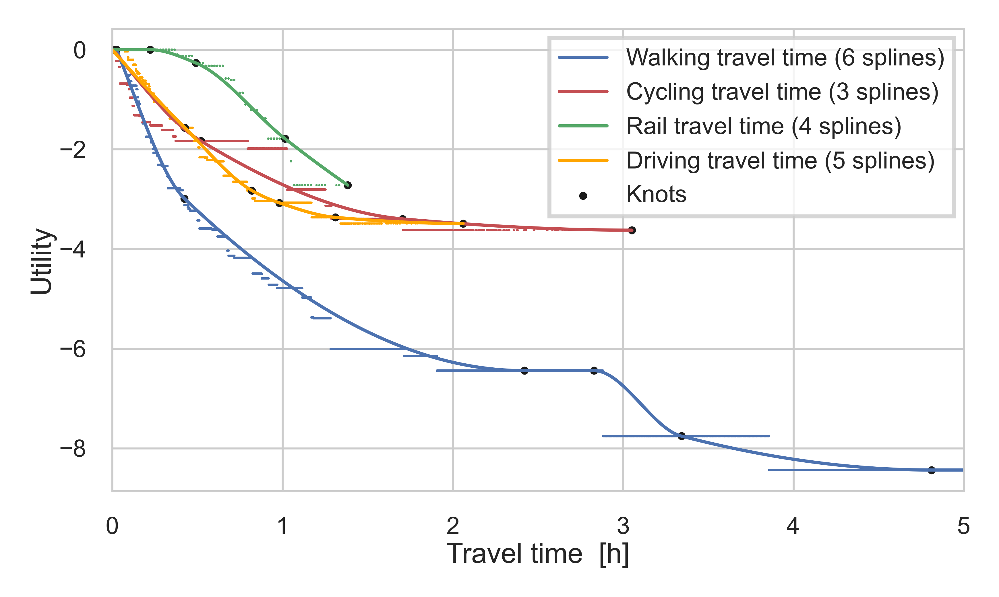

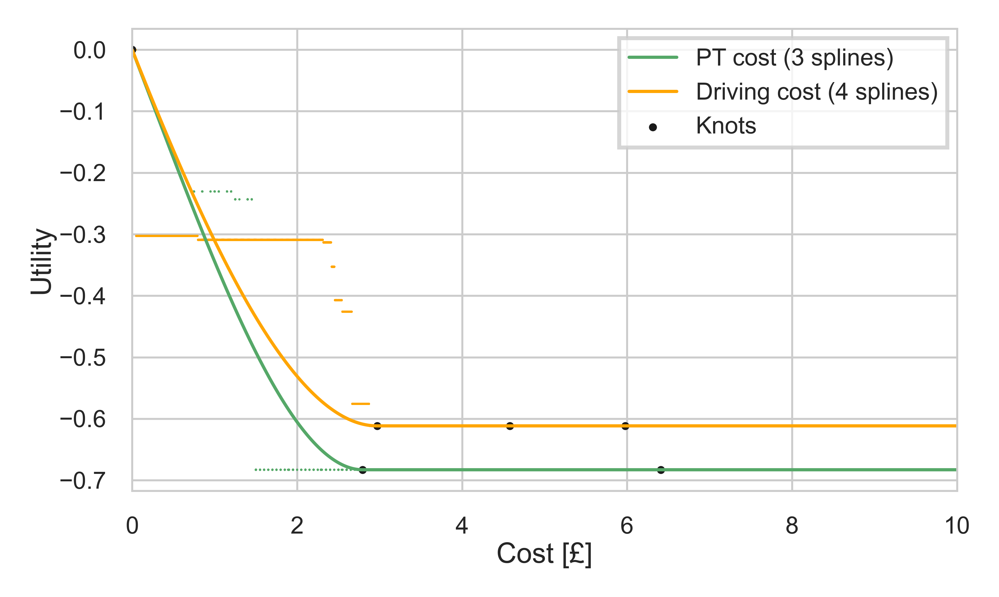

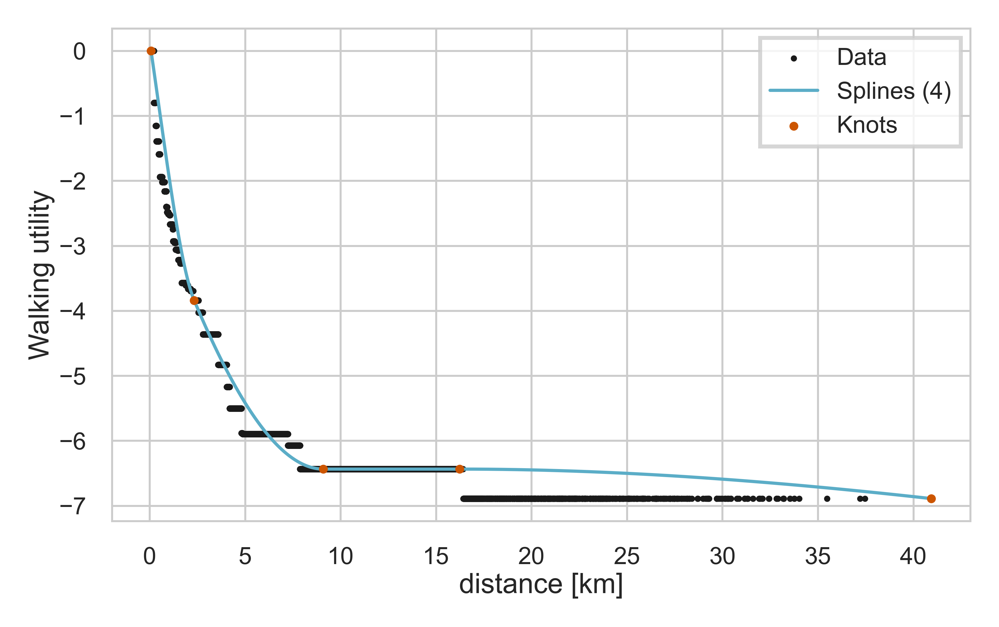

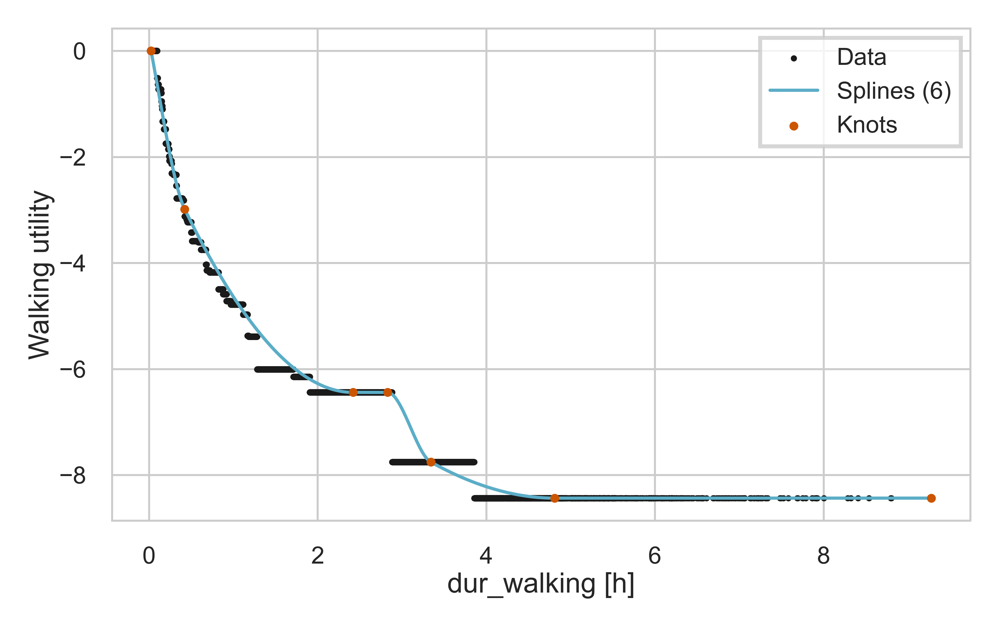

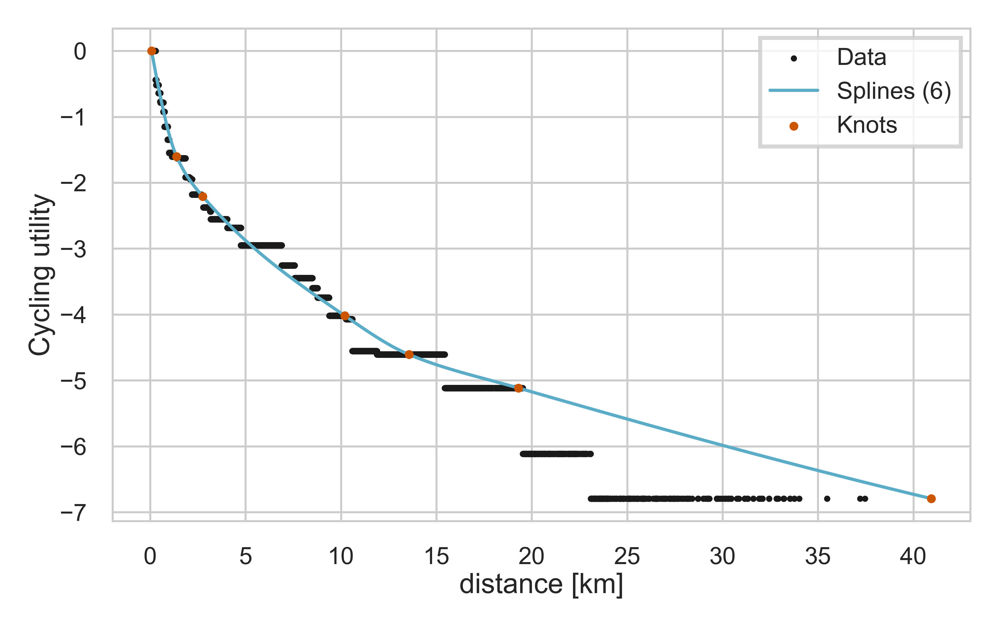

...

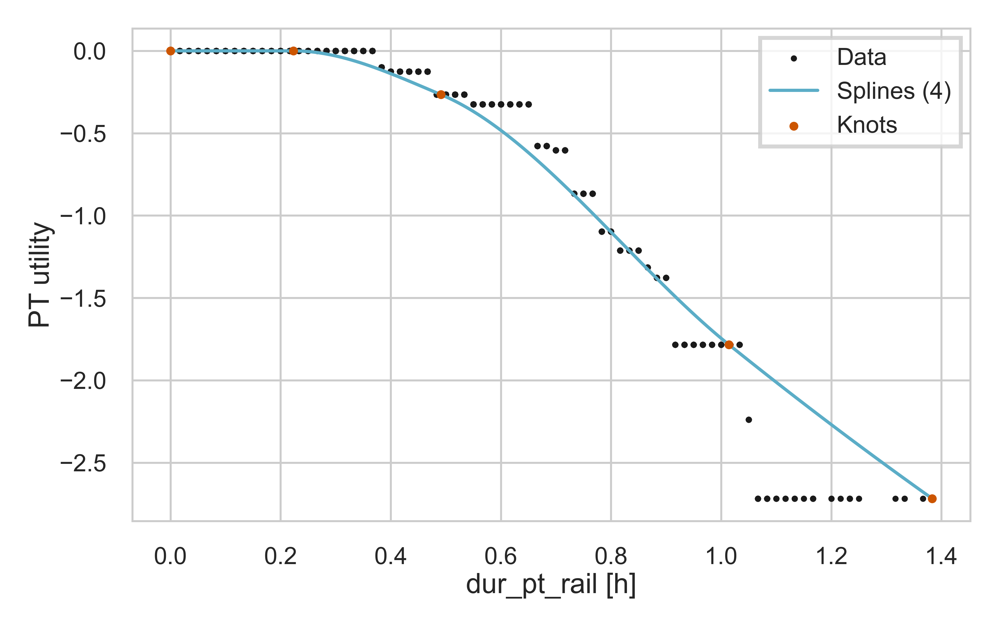

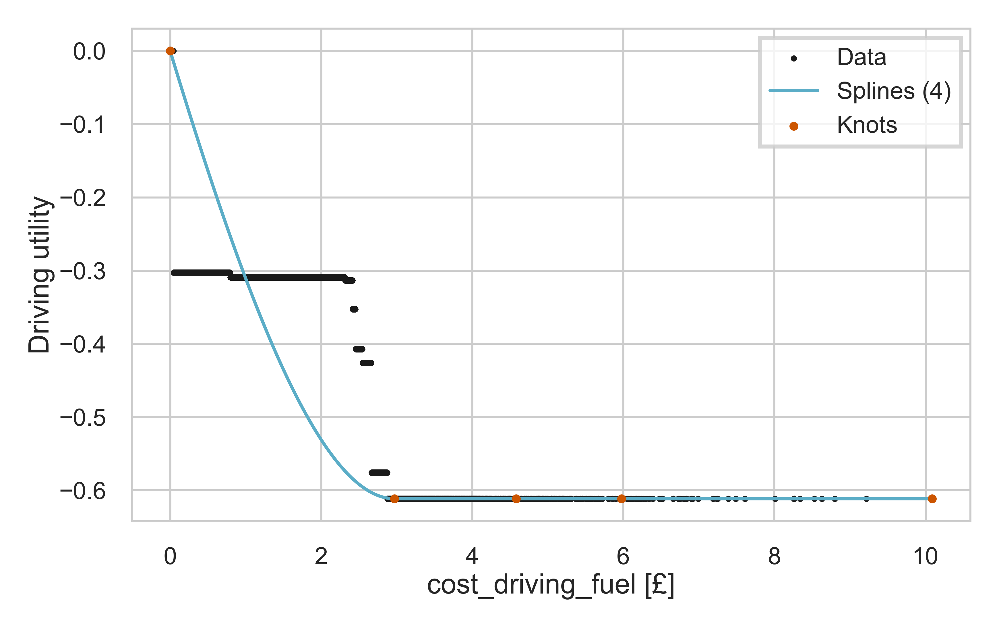

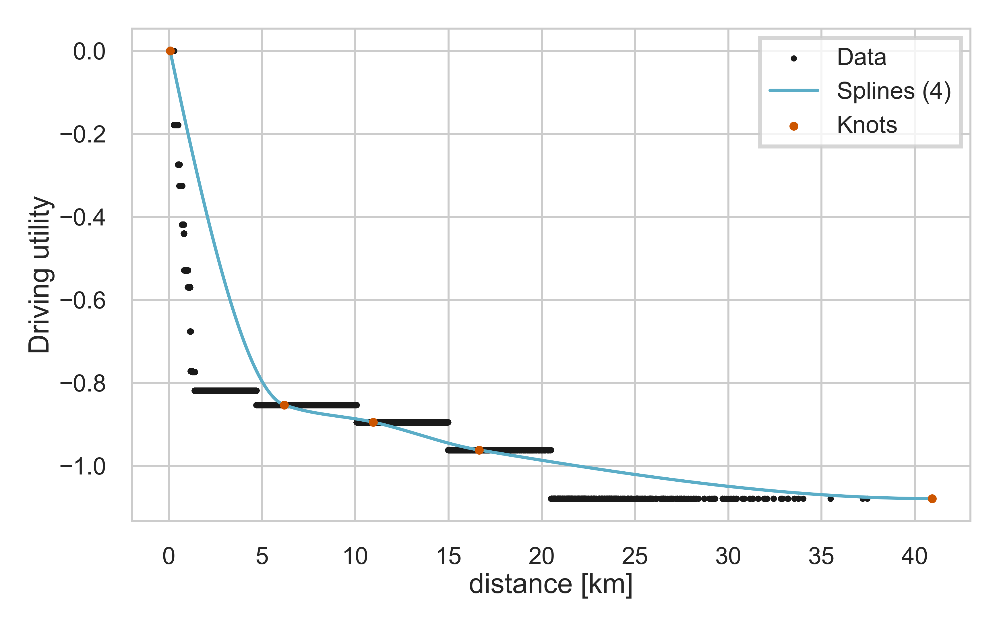

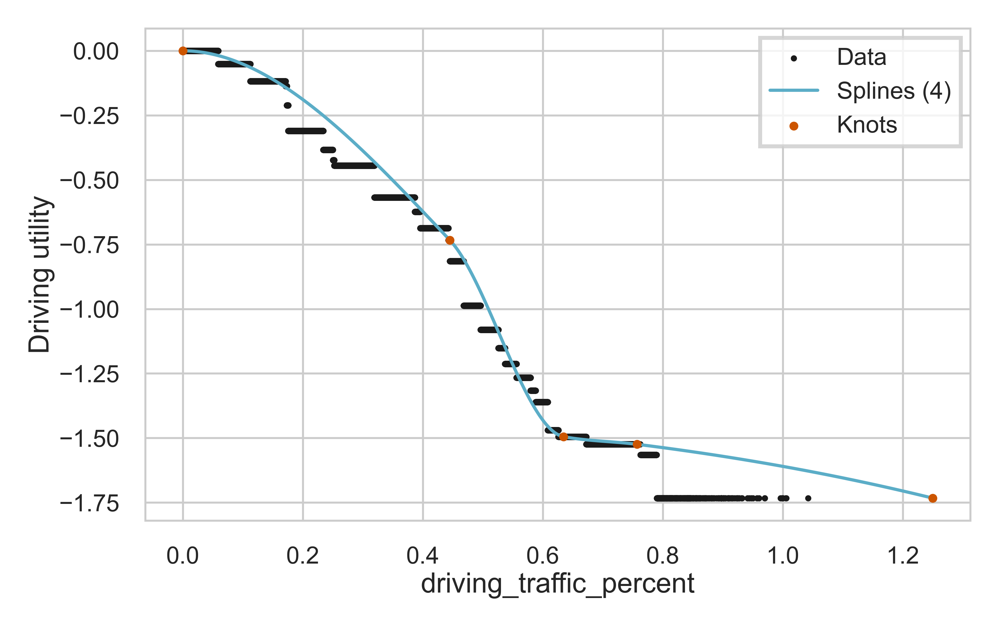

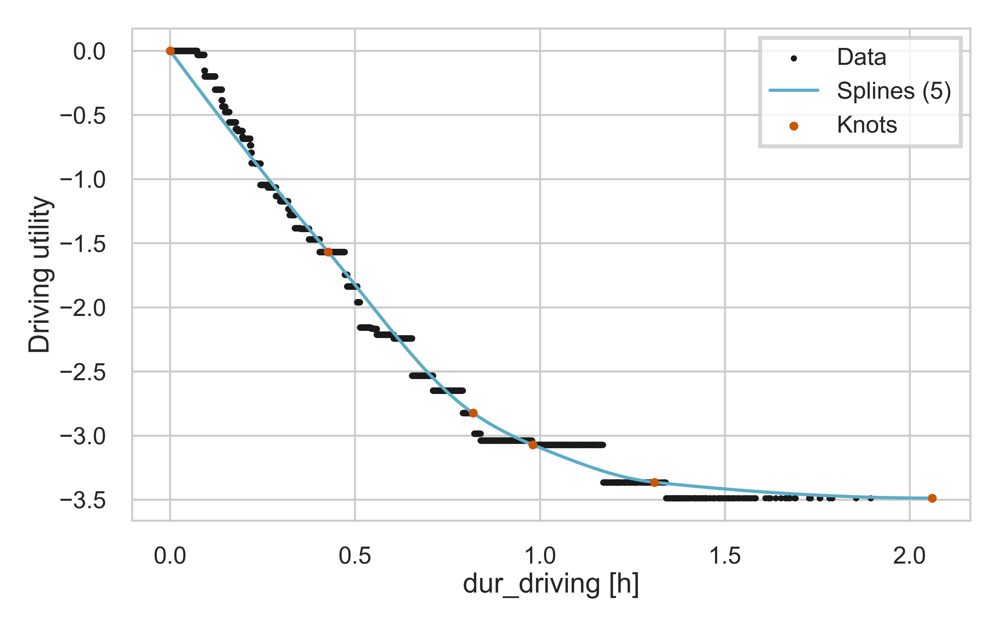

In [83]:
best_splines = spline_collection
utility_names = {'0':'Walking', '1':'Cycling', '2':'PT', '3':'Driving'}
plot_spline(LPMC_model_fully_trained,LPMC_train,best_splines, utility_names, x_knots_dict=x_knots_dict, lpmc_tt_cost=True)

In [84]:
from sklearn.metrics import log_loss
import numpy as np

# Universal Evaluation Block
# Required inputs: 
# - y_pred: predicted probabilities (n_samples, n_alternatives)
# - LPMC_test["choice"]: true labels
# - CE_final: already-computed Cross-Entropy Loss for the current method

y_true = LPMC_test["choice"].values
N = len(y_true)

# Cross Entropy Loss (already computed as CE_final)
CEL = CE_final

# Log-Likelihood = -CEL * N
log_likelihood = -CEL * N

# 0–1 Accuracy: proportion of correctly predicted top-choice labels
pred_labels = np.argmax(y_pred, axis=1)
accuracy_01 = np.mean(pred_labels == y_true)

# Top-1 Max Probability: average max probability per observation
top1_max_prob = np.mean(np.max(y_pred, axis=1))

# Output
print("Total LPMC size:", len(LPMC_train) + len(LPMC_test))
print("Evaluation Metrics")
print(f"Number of observations (N): {N}")
print(f"Cross-Entropy Loss (CEL): {CEL:.4f}")
print(f"Log-Likelihood: {log_likelihood:.2f}")
print(f"0-1 Accuracy: {accuracy_01:.4f}")
print(f"Top-1 Max Probability: {top1_max_prob:.4f}")


Total LPMC size: 81086
Evaluation Metrics
Number of observations (N): 26320
Cross-Entropy Loss (CEL): 0.6773
Log-Likelihood: -17827.05
0-1 Accuracy: 0.7407
Top-1 Max Probability: 0.7552


# LOESS

LOESS (Locally Estimated Scatterplot Smoothing) is a non-parametric method used to smooth utility functions by fitting local regressions

- **LOESS Regression**: Fits local weighted regressions with a smoothing factor (`frac`).
- **Monotonicity Enforcement**: Uses **Isotonic Regression** to ensure decreasing utility functions (if enabled).
- **Endpoint Weighting**: Adjusts the influence of the first and last points to mitigate boundary bias (optional).
- **Interpolation**: Converts the smoothed function into a callable interpolator for continuous evaluation.


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),
/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),


LOESS smoothing applied.
Smoothed final cross entropy loss (LOESS): 0.9650051333354236


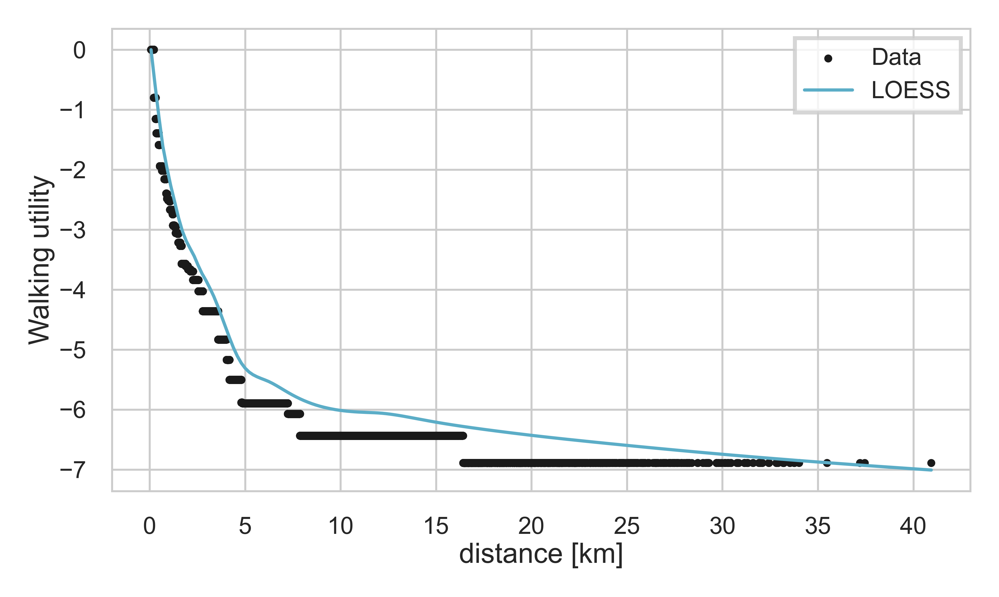

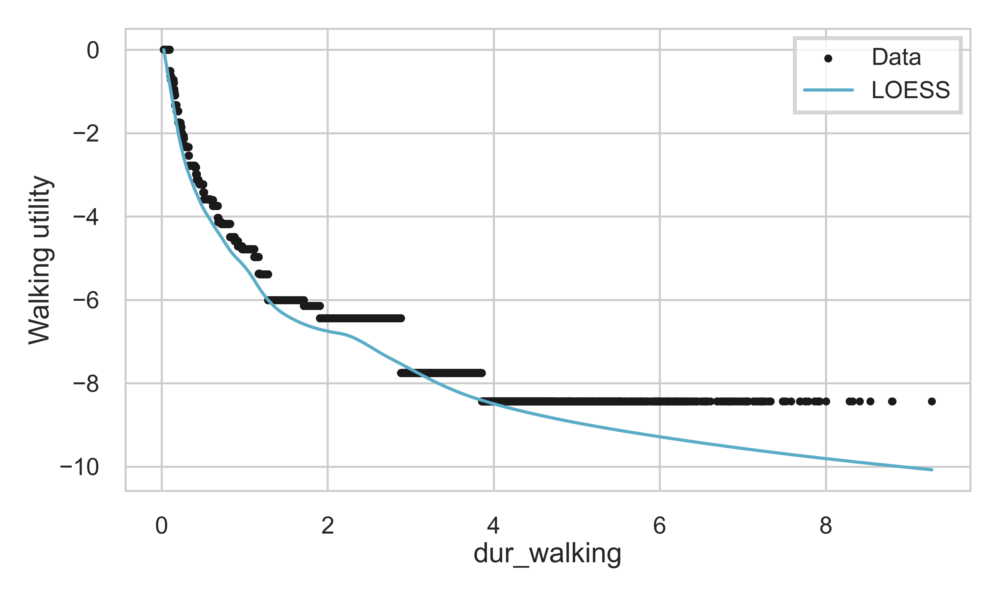

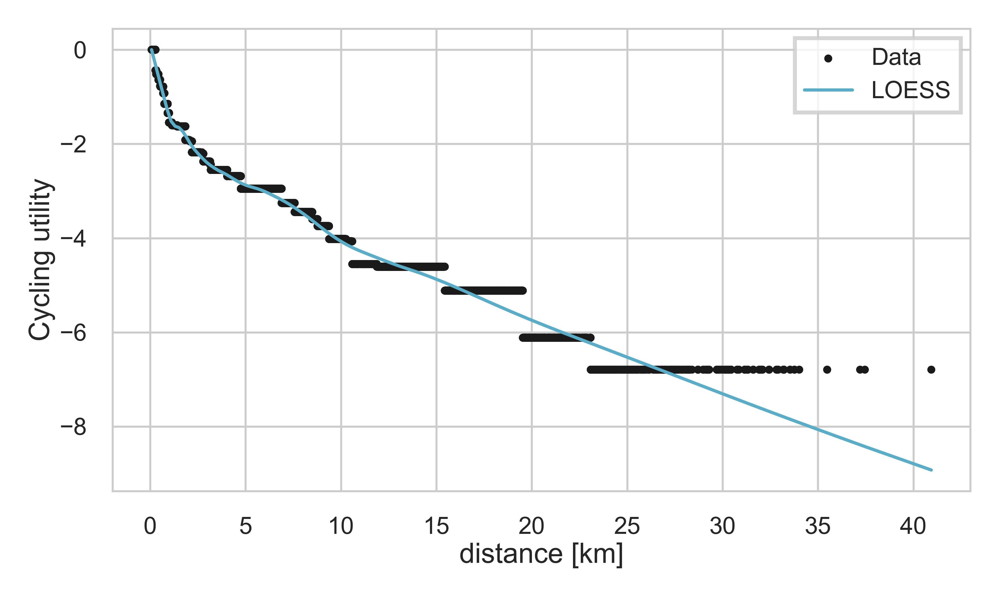

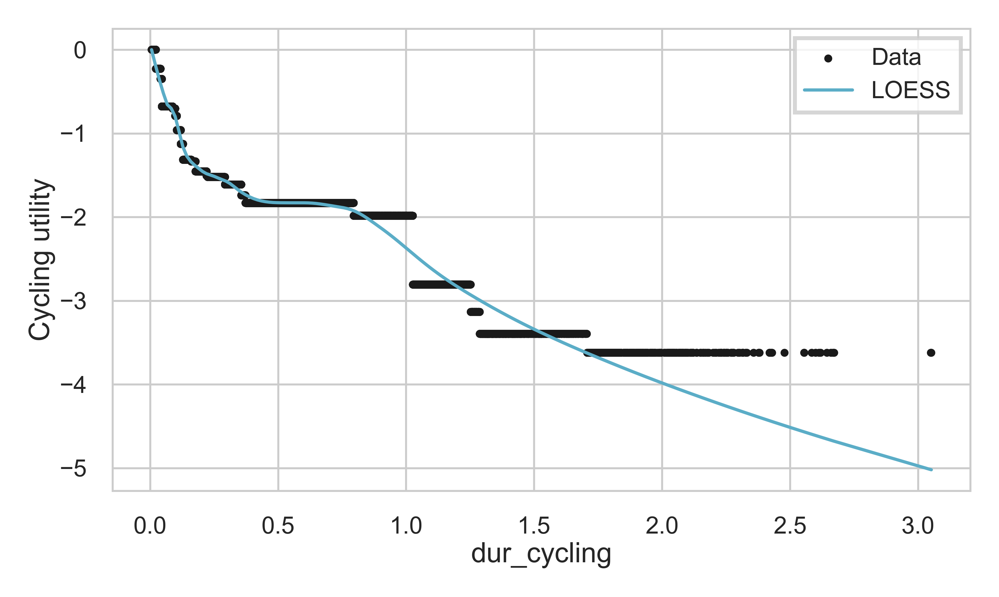

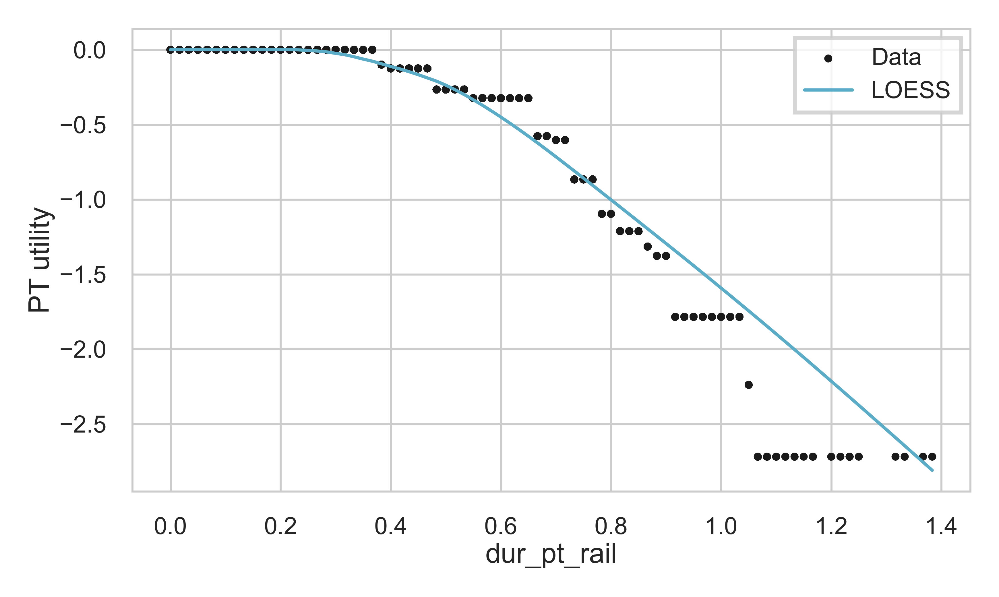

...

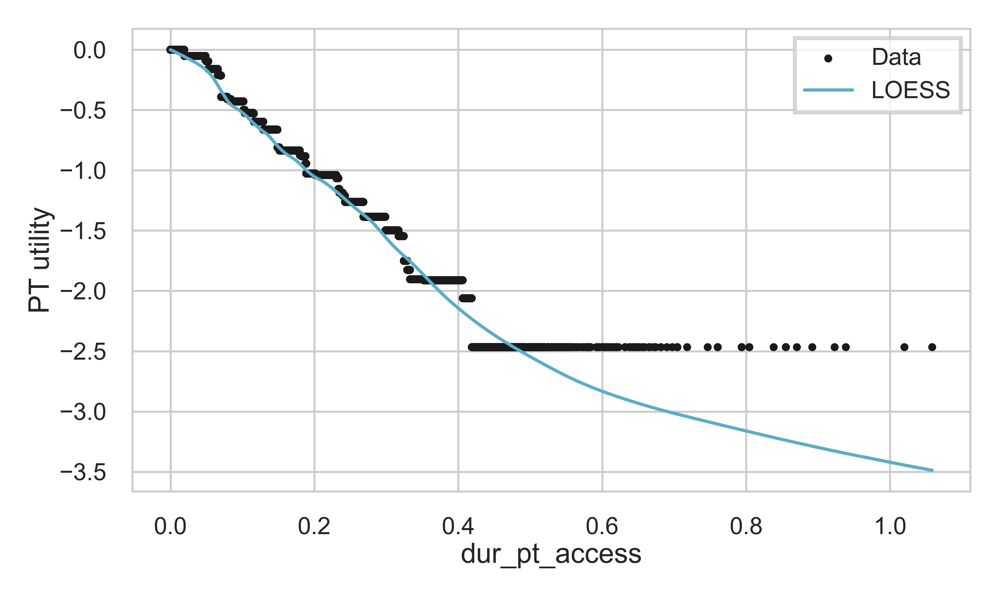

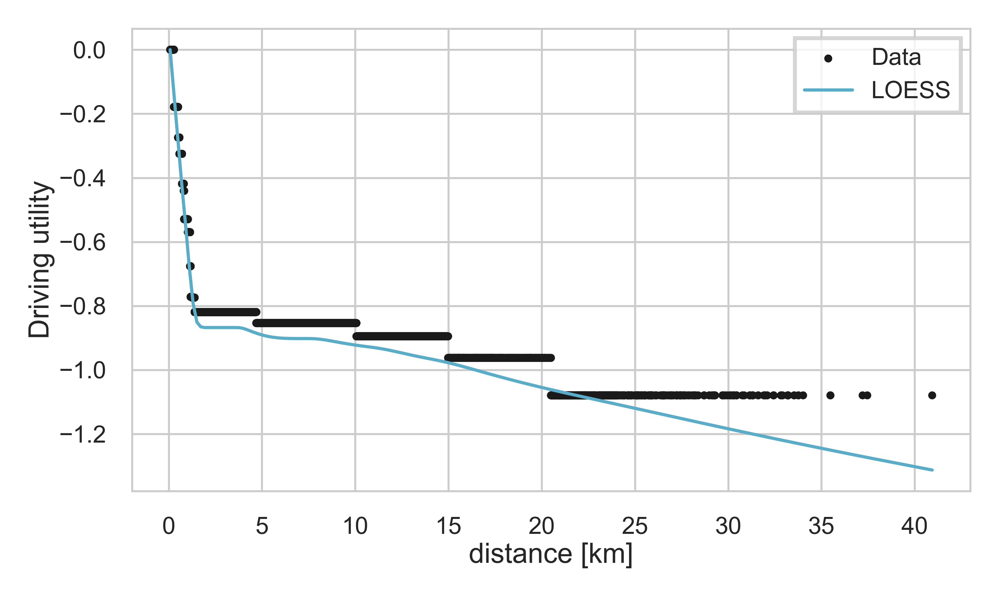

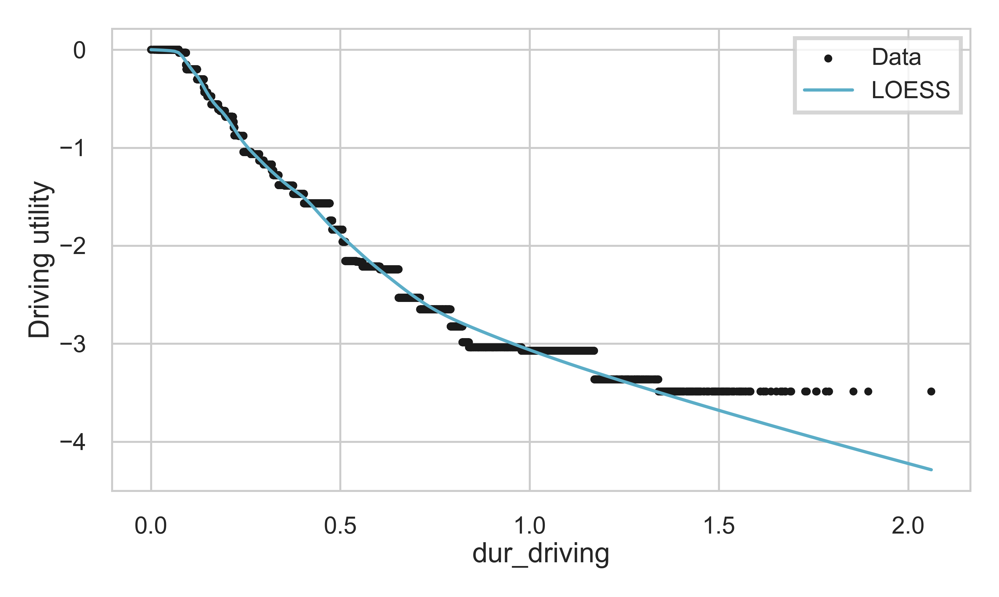

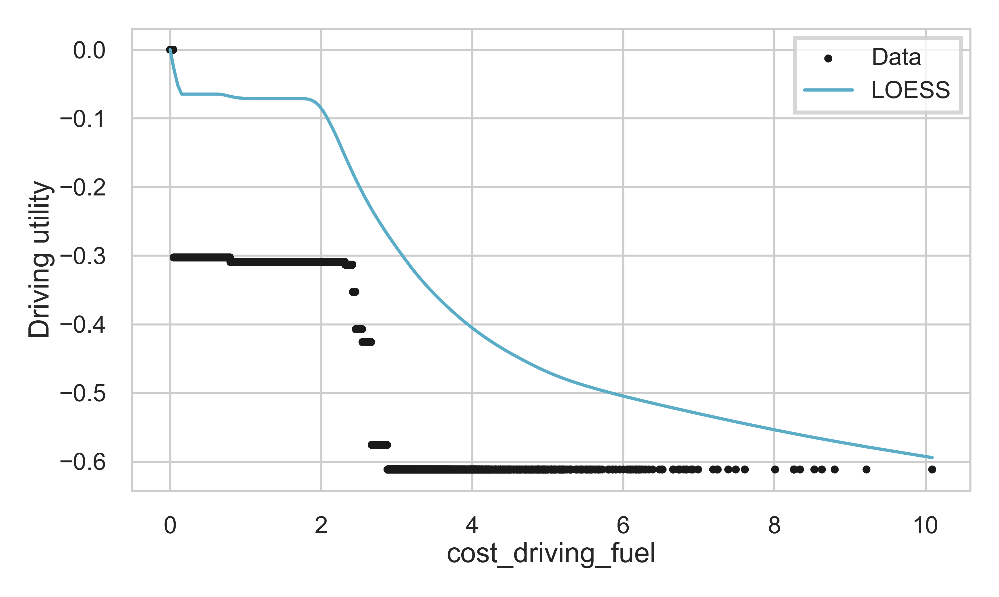

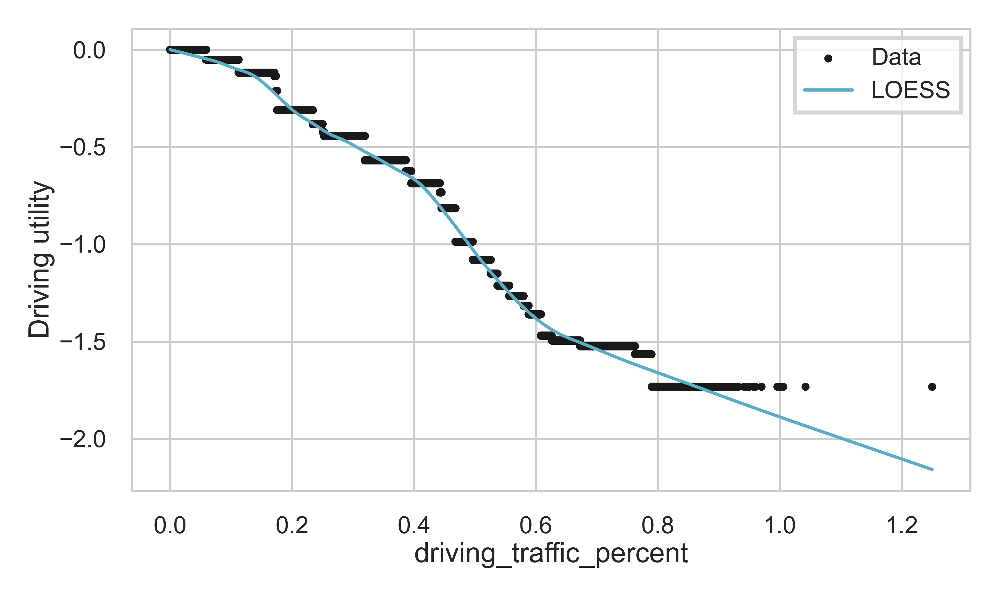

In [139]:
from rumboost.utility_smoothing import data_leaf_value
from rumboost.L_loess_smoothing import loess_smoother, plot_loess_smoothing  # Changed function names
import numpy as np
%load_ext autoreload
%autoreload 2

# Load model weights
weights = weights_to_plot_v2(LPMC_model_fully_trained)

loess_utilities = {
    '0': ['distance', 'dur_walking'],
    '1': ['distance', 'dur_cycling'],
    '2': ['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'],
    '3': ['distance', 'dur_driving', 'cost_driving_fuel', 'driving_traffic_percent']
}

util_collection = {}
for k in loess_utilities:
    util_collection[k] = {}
    for var in loess_utilities[k]:
        x_black, y_black = data_leaf_value(LPMC_train[var], weights[k][var], "data_weighted")
        if len(x_black) < 3:
            print(f"Skipping {var} for {k}: Not enough data points for LOESS smoothing.")
            continue
        
        # Apply LOESS with toggleable monotonicity
        util_collection[k][var] = loess_smoother(x_black, y_black, 
                                               frac=0.21085962642510148,
                                               use_endpoint_weighting=False,
                                               endpoint_weight=0,
                                               enforce_monotonicity=True,
                                               debug=False)  # Optional debugging
        
print("LOESS smoothing applied.")

y_pred = smooth_predict(LPMC_test, util_collection)
CE_final = cross_entropy(y_pred, LPMC_test['choice'])
print(f"Smoothed final cross entropy loss (LOESS): {CE_final}")

data_train = LPMC_train
utility_names = {'0': 'Walking', '1': 'Cycling', '2': 'PT', '3': 'Driving'}
plot_loess_smoothing(util_collection, utility_names, LPMC_train, weights)

## Hyperparameter Tuning for LOESS
**Bayesian optimization** (Hyperopt) to tune key parameters:

- **`frac` (Smoothing Fraction)**: Controls the proportion of data used in each local regression.
- **`endpoint_weight`**: Adjusts the relative importance of the first and last points to reduce boundary bias.



Total LPMC size: 81086
Evaluation Metrics
Number of observations (N): 26320
Cross-Entropy Loss (CEL): 0.9650
Log-Likelihood: -25398.94
0-1 Accuracy: 0.6234
Top-1 Max Probability: 0.5369

In [140]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

# Define the parameter space for LOESS tuning  
param_space = {
    'frac': hp.uniform('frac', 0.1, 0.6),  # Narrower range - 0.1 to 0.6 typically sufficient
    'endpoint_weight': hp.choice('endpoint_weight', [0, hp.uniform('endpoint_weight_value', 0.01, 0.1)]),
    'use_endpoint_weighting': hp.choice('use_endpoint_weighting', [True, False])  # Independently toggle
}

def loess_objective(params):
    """
    Objective function for Hyperopt to minimize cross-entropy loss.
    Applies LOESS smoothing using given parameters and evaluates the loss.
    """
    # Extract the parameters
    frac = params['frac']
    use_endpoint_weighting = params['use_endpoint_weighting']
    
    # Handle the conditional endpoint_weight
    if isinstance(params['endpoint_weight'], int) and params['endpoint_weight'] == 0:
        endpoint_weight = 0.0
    else:
        endpoint_weight = params['endpoint_weight']
    
    # Build the LOESS utility collection using these parameters
    util_collection = {}
    for k in loess_utilities:
        util_collection[k] = {}
        for var in loess_utilities[k]:
            # Retrieve GBUV
            x_black, y_black = data_leaf_value(LPMC_train[var], weights[k][var], "data_weighted")
            
            if len(x_black) < 3:
                print(f"Skipping {var} for {k}: Not enough data points for LOESS smoothing.")
                continue
            
            # Apply LOESS smoothing with current parameters
            util_collection[k][var] = loess_smoother(x_black, y_black,
                                                   frac=frac,
                                                   use_endpoint_weighting=use_endpoint_weighting,
                                                   endpoint_weight=endpoint_weight,
                                                   enforce_monotonicity=True)
    
    # Generate predictions using the smoothed utility functions
    try:
        y_pred = smooth_predict(LPMC_test, util_collection)
        # Compute cross entropy loss on the test set
        ce_loss = cross_entropy(y_pred, LPMC_test['choice'])
    except Exception as e:
        print(f"Error with parameters {params}: {e}")
        return {'loss': float('inf'), 'status': STATUS_OK}
    
    return {'loss': ce_loss, 'status': STATUS_OK}

# Set up Hyperopt trials and run the optimization
trials = Trials()
best_params = fmin(fn=loess_objective,
                   space=param_space,
                   algo=tpe.suggest,
                   max_evals=100,
                   trials=trials,
                   verbose=True,  # Show progress
                   rstate=np.random.default_rng(42))  # For reproducibility

print("Best LOESS parameters:", best_params)

# Also print the actual best parameters in a cleaner format
best_clean = {
    'frac': best_params['frac'],
    'use_endpoint_weighting': best_params['use_endpoint_weighting'] == 0,  # Convert from 0/1 to True/False
    'endpoint_weight': 0.0 if best_params['endpoint_weight'] == 0 else best_params['endpoint_weight']
}
print("Best parameters (cleaned):", best_clean)

# Extract the best cross-entropy value
best_loss = trials.best_trial['result']['loss']
print(f"Best cross-entropy loss: {best_loss}")

# Optional: Look at the top 5 parameter combinations
sorted_trials = sorted(trials.trials, key=lambda x: x['result']['loss'])
print("\nTop 5 parameter combinations:")
for i, trial in enumerate(sorted_trials[:5]):
    print(f"{i+1}. Loss: {trial['result']['loss']:.6f}")
    print(f"   Parameters: {trial['misc']['vals']}")

  0%|          | 0/100 [00:00<?, ?trial/s, best loss=?]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



  1%|          | 1/100 [00:19<32:45, 19.85s/trial, best loss: 0.9681473296411824]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



  2%|▏         | 2/100 [00:36<29:31, 18.07s/trial, best loss: 0.9672330484512183]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

  3%|▎         | 3/100 [00:44<21:20, 13.20s/trial, best loss: 0.9651581501925277]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



  4%|▍         | 4/100 [00:53<18:57, 11.85s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

  5%|▌         | 5/100 [01:02<16:43, 10.56s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



  6%|▌         | 6/100 [01:11<15:40, 10.00s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



  7%|▋         | 7/100 [01:38<24:10, 15.60s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



  8%|▊         | 8/100 [01:59<26:32, 17.31s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



  9%|▉         | 9/100 [02:19<27:42, 18.27s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 10%|█         | 10/100 [02:34<25:49, 17.22s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 11%|█         | 11/100 [02:41<21:03, 14.20s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 12%|█▏        | 12/100 [02:58<22:04, 15.05s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 13%|█▎        | 13/100 [03:18<23:42, 16.35s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 14%|█▍        | 14/100 [03:32<22:39, 15.81s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 15%|█▌        | 15/100 [03:54<24:59, 17.65s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 16%|█▌        | 16/100 [04:22<29:03, 20.76s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 17%|█▋        | 17/100 [04:43<28:36, 20.68s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 18%|█▊        | 18/100 [04:51<23:04, 16.88s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 19%|█▉        | 19/100 [05:13<25:02, 18.55s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 20%|██        | 20/100 [05:33<25:11, 18.90s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 21%|██        | 21/100 [05:44<21:50, 16.59s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 22%|██▏       | 22/100 [05:55<19:27, 14.97s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 23%|██▎       | 23/100 [06:06<17:31, 13.66s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 24%|██▍       | 24/100 [06:18<16:51, 13.31s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 25%|██▌       | 25/100 [06:27<15:03, 12.05s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 26%|██▌       | 26/100 [06:40<14:54, 12.09s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 27%|██▋       | 27/100 [06:46<12:32, 10.30s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 28%|██▊       | 28/100 [06:58<13:06, 10.93s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 29%|██▉       | 29/100 [07:07<12:16, 10.37s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 30%|███       | 30/100 [07:21<13:14, 11.34s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 31%|███       | 31/100 [07:37<14:40, 12.76s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 32%|███▏      | 32/100 [07:46<13:09, 11.61s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 33%|███▎      | 33/100 [07:52<11:10, 10.00s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 34%|███▍      | 34/100 [08:06<12:17, 11.17s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 35%|███▌      | 35/100 [08:14<11:15, 10.39s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 36%|███▌      | 36/100 [08:30<12:44, 11.95s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 37%|███▋      | 37/100 [08:40<11:54, 11.34s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 38%|███▊      | 38/100 [08:51<11:44, 11.37s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 39%|███▉      | 39/100 [08:59<10:20, 10.17s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 40%|████      | 40/100 [09:09<10:04, 10.07s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 41%|████      | 41/100 [09:22<10:55, 11.11s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 42%|████▏     | 42/100 [09:40<12:44, 13.19s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 43%|████▎     | 43/100 [09:47<10:46, 11.33s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 44%|████▍     | 44/100 [09:59<10:36, 11.36s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 45%|████▌     | 45/100 [10:14<11:31, 12.57s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 46%|████▌     | 46/100 [10:28<11:49, 13.14s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 47%|████▋     | 47/100 [10:37<10:16, 11.64s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 48%|████▊     | 48/100 [10:54<11:35, 13.38s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 49%|████▉     | 49/100 [11:04<10:32, 12.40s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 50%|█████     | 50/100 [11:15<10:03, 12.07s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 51%|█████     | 51/100 [11:33<11:09, 13.67s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 52%|█████▏    | 52/100 [11:47<11:05, 13.87s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 53%|█████▎    | 53/100 [12:02<11:11, 14.28s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 54%|█████▍    | 54/100 [12:10<09:25, 12.28s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 55%|█████▌    | 55/100 [12:18<08:09, 10.89s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 56%|█████▌    | 56/100 [12:27<07:44, 10.57s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 57%|█████▋    | 57/100 [12:36<07:14, 10.10s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 58%|█████▊    | 58/100 [12:47<07:06, 10.15s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 59%|█████▉    | 59/100 [13:00<07:34, 11.09s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 60%|██████    | 60/100 [13:23<09:51, 14.78s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 61%|██████    | 61/100 [13:34<08:51, 13.63s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 62%|██████▏   | 62/100 [13:54<09:50, 15.55s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 63%|██████▎   | 63/100 [14:12<09:55, 16.09s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 64%|██████▍   | 64/100 [14:20<08:16, 13.78s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 65%|██████▌   | 65/100 [14:27<06:46, 11.60s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 66%|██████▌   | 66/100 [14:36<06:15, 11.04s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 67%|██████▋   | 67/100 [14:46<05:49, 10.59s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 68%|██████▊   | 68/100 [14:58<05:52, 11.01s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 69%|██████▉   | 69/100 [15:09<05:43, 11.09s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 70%|███████   | 70/100 [15:23<05:59, 11.99s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 71%|███████   | 71/100 [15:31<05:11, 10.72s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 72%|███████▏  | 72/100 [15:44<05:21, 11.50s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 73%|███████▎  | 73/100 [15:57<05:18, 11.80s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 74%|███████▍  | 74/100 [16:09<05:09, 11.92s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 75%|███████▌  | 75/100 [16:21<04:57, 11.92s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 76%|███████▌  | 76/100 [16:28<04:14, 10.60s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 77%|███████▋  | 77/100 [16:39<04:05, 10.68s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 78%|███████▊  | 78/100 [16:47<03:37,  9.89s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 79%|███████▉  | 79/100 [16:57<03:24,  9.75s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 80%|████████  | 80/100 [17:12<03:46, 11.30s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 81%|████████  | 81/100 [17:21<03:20, 10.57s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 82%|████████▏ | 82/100 [17:28<02:51,  9.54s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 83%|████████▎ | 83/100 [17:43<03:10, 11.19s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 84%|████████▍ | 84/100 [17:59<03:21, 12.58s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 85%|████████▌ | 85/100 [18:05<02:41, 10.75s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 86%|████████▌ | 86/100 [18:17<02:34, 11.00s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 87%|████████▋ | 87/100 [18:32<02:41, 12.43s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 88%|████████▊ | 88/100 [18:43<02:23, 11.92s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 89%|████████▉ | 89/100 [18:54<02:08, 11.72s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 90%|█████████ | 90/100 [19:04<01:51, 11.18s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 91%|█████████ | 91/100 [19:12<01:32, 10.25s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 92%|█████████▏| 92/100 [19:21<01:18,  9.86s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 93%|█████████▎| 93/100 [19:37<01:21, 11.59s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 94%|█████████▍| 94/100 [19:45<01:03, 10.66s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 95%|█████████▌| 95/100 [20:02<01:02, 12.44s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 96%|█████████▌| 96/100 [20:24<01:00, 15.15s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 97%|█████████▋| 97/100 [20:42<00:48, 16.13s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in div

 98%|█████████▊| 98/100 [20:49<00:26, 13.44s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



 99%|█████████▉| 99/100 [21:02<00:13, 13.27s/trial, best loss: 0.9650006692054509]

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),

/Users/leovilardo/rumboost/venv/lib/python3.11/site-packages/statsmodels/nonparametric/smoothers_lowess.py:226: RuntimeWarning: invalid value encountered in divide
  res, _ = _lowess(y, x, x, np.ones_like(x),



100%|██████████| 100/100 [21:16<00:00, 12.76s/trial, best loss: 0.9650006692054509]
Best LOESS parameters: {'endpoint_weight': 0, 'frac': 0.20610855849666762, 'use_endpoint_weighting': 1}
Best parameters (cleaned): {'frac': 0.20610855849666762, 'use_endpoint_weighting': False, 'endpoint_weight': 0.0}
Best cross-entropy loss: 0.9650006692054509

Top 5 parameter combinations:
1. Loss: 0.965001
   Parameters: {'endpoint_weight': [0], 'endpoint_weight_value': [], 'frac': [0.20610855849666762], 'use_endpoint_weighting': [1]}
2. Loss: 0.965001
   Parameters: {'endpoint_weight': [1], 'endpoint_weight_value': [0.0581267138652996], 'frac': [0.19212594441248537], 'use_endpoint_weighting': [1]}
3. Loss: 0.965005
   Parameters: {'endpoint_weight': [1], 'endpoint_weight_value': [0.010050101843136865], 'frac': [0.20384805314832732], 'use_endpoint_weighting': [1]}
4. Loss: 0.965006
   Parameters: {'endpoint_weight': [1], 'endpoint_weight_value': [0.03510203555507693], 'frac': [0.19725094562640463], '

In [57]:
from sklearn.metrics import log_loss
import numpy as np

# Universal Evaluation Block
# Required inputs: 
# - y_pred: predicted probabilities (n_samples, n_alternatives)
# - LPMC_test["choice"]: true labels
# - CE_final: already-computed Cross-Entropy Loss for the current method

y_true = LPMC_test["choice"].values
N = len(y_true)

# Cross Entropy Loss (already computed as CE_final)
CEL = CE_final

# Log-Likelihood = -CEL * N
log_likelihood = -CEL * N

# 0–1 Accuracy: proportion of correctly predicted top-choice labels
pred_labels = np.argmax(y_pred, axis=1)
accuracy_01 = np.mean(pred_labels == y_true)

# Top-1 Max Probability: average max probability per observation
top1_max_prob = np.mean(np.max(y_pred, axis=1))

# Output
print("Total LPMC size:", len(LPMC_train) + len(LPMC_test))
print("Evaluation Metrics")
print(f"Number of observations (N): {N}")
print(f"Cross-Entropy Loss (CEL): {CEL:.4f}")
print(f"Log-Likelihood: {log_likelihood:.2f}")
print(f"0-1 Accuracy: {accuracy_01:.4f}")
print(f"Top-1 Max Probability: {top1_max_prob:.4f}")


Total LPMC size: 81086
Evaluation Metrics
Number of observations (N): 26320
Cross-Entropy Loss (CEL): 0.9650
Log-Likelihood: -25398.94
0-1 Accuracy: 0.6234
Top-1 Max Probability: 0.5369


# Moving Average Smoothing


- Used an **adaptive windowing approach** to dynamically adjust smoothness based on data density.
- **Fix endpoint weighting** to ensure stable boundary behavior.
- **Optionally enforce monotonicity** for behavioral consistency.
- Optimize hyperparameters to balance **smoothness vs. accuracy**.


In [1]:
from rumboost.utility_smoothing import data_leaf_value
from rumboost.L_moving_average import moving_average_smoother, plot_moving_average_smoothing
import numpy as np
%load_ext autoreload
%autoreload 2

# Load model weights
weights = weights_to_plot_v2(LPMC_model_fully_trained)

moving_average_utilities = {
    '0': ['distance', 'dur_walking'],
    '1': ['distance', 'dur_cycling'],
    '2': ['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'],
    '3': ['distance', 'dur_driving', 'cost_driving_fuel', 'driving_traffic_percent']
}

util_collection = {}
for k in moving_average_utilities:
    util_collection[k] = {}
    for var in moving_average_utilities[k]:
        x_black, y_black = data_leaf_value(LPMC_train[var], weights[k][var], "data_weighted")
        if len(x_black) < 3:
            print(f"Skipping {var} for {k}: Not enough data points for moving average smoothing.")
            continue
        
        # Apply distance-based moving average with adaptive window
        util_collection[k][var] = moving_average_smoother(
            x_black, y_black,
            window_radius=0.5,  # Default if not adaptive
            use_adaptive_window=True,
            min_radius=0.1,
            max_radius=2.0,
            scaling_factor=0.5,
            use_endpoint_weighting=True,
            endpoint_weight=0.3,
            enforce_monotonicity=True,
            debug=False
        )
        
print("Moving average smoothing applied.")

y_pred = smooth_predict(LPMC_test, util_collection)
CE_final = cross_entropy(y_pred, LPMC_test['choice'])
print(f"Smoothed final cross entropy loss (Moving Average): {CE_final}")

data_train = LPMC_train
utility_names = {'0': 'Walking', '1': 'Cycling', '2': 'PT', '3': 'Driving'}
plot_moving_average_smoothing(util_collection, utility_names, LPMC_train, weights)

ModuleNotFoundError: No module named 'rumboost'

## Hyperparameter Tuning for Moving Average Smoothing

 **Bayesian Optimization** (Hyperopt) to tune:
- `c`: Scaling factor for density-based windowing.
- `W_min`: Minimum window size.
- `W_max`: Maximum window size.

best loss: 0.9674993419230918
Best Moving Average parameters: {'W_max': 3084.0, 'W_min': 800.0, 'c': 0.1046820984724704}

100%|██████████| 100/100 [04:46<00:00,  2.87s/trial, best loss: 0.96751744401314]
Best Moving Average parameters: {'W_max': 2917.0, 'W_min': 849.0, 'c': 0.11727701697141786}

100%|██████████| 100/100 [04:22<00:00,  2.62s/trial, best loss: 0.9673490627557905]
Best Moving Average parameters: {'W_max': 2605.0, 'W_min': 501.0, 'c': 0.05538102262108027}

Total LPMC size: 81086
Evaluation Metrics
Number of observations (N): 26320
Cross-Entropy Loss (CEL): 0.9675
Log-Likelihood: -25464.57
0-1 Accuracy: 0.6215
Top-1 Max Probability: 0.5364

In [180]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import numpy as np

# Simplified parameter space for Moving Average smoothing
param_space = {
    # Only tune the window radius scale and scaling factor
    'window_radius_scale': hp.uniform('window_radius_scale', 0.05, 0.25),  # Narrower range
    'scaling_factor': hp.uniform('scaling_factor', 0.1, 2.0),
    
    # Fixed endpoint handling
    'use_endpoint_weighting': True,  # Fixed
    'endpoint_weight': 0.05         # Fixed
}

def moving_average_objective(params):
    """
    Simplified objective function for Hyperopt to minimize cross-entropy loss.
    """
    # Extract parameters
    window_radius_scale = params['window_radius_scale']
    scaling_factor = params['scaling_factor']
    
    # Build the Moving Average utility collection using these parameters
    util_collection = {}
    for k in moving_average_utilities:
        util_collection[k] = {}
        for var in moving_average_utilities[k]:
            # Retrieve raw data points
            try:
                x_black, y_black = data_leaf_value(LPMC_train[var], weights[k][var], "data_weighted")
                
                if len(x_black) < 3:
                    continue
                
                # Calculate domain-specific window parameters
                x_range = max(np.max(x_black) - np.min(x_black), 1e-6)  # Prevent zero division
                
                # Convert scale parameters to actual distances
                window_radius = x_range * window_radius_scale
                min_radius = window_radius * 0.5    # Fixed ratio: min = 50% of window
                max_radius = window_radius * 2.0    # Fixed ratio: max = 200% of window
                
                # Apply the moving average smoother with current parameters
                util_collection[k][var] = moving_average_smoother(
                    x_black, y_black,
                    window_radius=window_radius,
                    use_adaptive_window=True,
                    min_radius=min_radius,
                    max_radius=max_radius,
                    scaling_factor=scaling_factor,
                    use_endpoint_weighting=True,  # Fixed
                    endpoint_weight=0.05,         # Fixed
                    enforce_monotonicity=True,
                    debug=False
                )
            except Exception as e:
                print(f"Error processing {var} for {k}: {e}")
                continue
    
    # Generate predictions using the smoothed utility functions
    try:
        y_pred = smooth_predict(LPMC_test, util_collection)
        ce_loss = cross_entropy(y_pred, LPMC_test['choice'])
    except Exception as e:
        print(f"Error during prediction/loss calculation: {e}")
        return {'loss': float('inf'), 'status': STATUS_OK}
    
    return {'loss': ce_loss, 'status': STATUS_OK}

# Run Hyperopt optimization
trials = Trials()
best_params = fmin(
    fn=moving_average_objective,
    space=param_space,
    algo=tpe.suggest,
    max_evals=30,  # Reduced from 50 for faster tuning
    trials=trials,
    verbose=True,
    rstate=np.random.default_rng(42)
)

# Extract best parameters
print("\nBest Moving Average parameters:")
print(f"  Window radius scale: {best_params['window_radius_scale']:.4f}")
print(f"  Scaling factor: {best_params['scaling_factor']:.4f}")

# Extract the best cross-entropy value
best_loss = trials.best_trial['result']['loss']
print(f"Best cross-entropy loss: {best_loss:.6f}")

# Show top 3 parameter combinations
sorted_trials = sorted(trials.trials, key=lambda x: x['result']['loss'])
print("\nTop 3 parameter combinations:")
for i, trial in enumerate(sorted_trials[:3]):
    print(f"{i+1}. Loss: {trial['result']['loss']:.6f}")
    print(f"   Window radius scale: {trial['misc']['vals']['window_radius_scale'][0]:.4f}")
    print(f"   Scaling factor: {trial['misc']['vals']['scaling_factor'][0]:.4f}")

100%|██████████| 30/30 [26:51<00:00, 53.73s/trial, best loss: 0.9809965804933664]

Best Moving Average parameters:
  Window radius scale: 0.0501
  Scaling factor: 0.6006
Best cross-entropy loss: 0.980997

Top 3 parameter combinations:
1. Loss: 0.980997
   Window radius scale: 0.0501
   Scaling factor: 0.6006
2. Loss: 0.980997
   Window radius scale: 0.0501
   Scaling factor: 0.5757
3. Loss: 0.981691
   Window radius scale: 0.0513
   Scaling factor: 0.7091


In [60]:
from sklearn.metrics import log_loss
import numpy as np

# Universal Evaluation Block
# Required inputs: 
# - y_pred: predicted probabilities (n_samples, n_alternatives)
# - LPMC_test["choice"]: true labels
# - CE_final: already-computed Cross-Entropy Loss for the current method

y_true = LPMC_test["choice"].values
N = len(y_true)

# Cross Entropy Loss (already computed as CE_final)
CEL = CE_final

# Log-Likelihood = -CEL * N
log_likelihood = -CEL * N

# 0–1 Accuracy: proportion of correctly predicted top-choice labels
pred_labels = np.argmax(y_pred, axis=1)
accuracy_01 = np.mean(pred_labels == y_true)

# Top-1 Max Probability: average max probability per observation
top1_max_prob = np.mean(np.max(y_pred, axis=1))

# Output
print("Total LPMC size:", len(LPMC_train) + len(LPMC_test))
print("Evaluation Metrics")
print(f"Number of observations (N): {N}")
print(f"Cross-Entropy Loss (CEL): {CEL:.4f}")
print(f"Log-Likelihood: {log_likelihood:.2f}")
print(f"0-1 Accuracy: {accuracy_01:.4f}")
print(f"Top-1 Max Probability: {top1_max_prob:.4f}")


Total LPMC size: 81086
Evaluation Metrics
Number of observations (N): 26320
Cross-Entropy Loss (CEL): 0.9675
Log-Likelihood: -25464.57
0-1 Accuracy: 0.6215
Top-1 Max Probability: 0.5364


# PCUF with Adaptive Knot Placement

Adaptive Knot Selection Based on Data Spread
The function determine_num_knots() selects the number of knots dynamically using a heuristic that considers the spread of the data. It computes the interquartile range (IQR) and standard deviation to measure data variability and then normalizes this value relative to the data range. This results in an adaptive number of knots, ensuring that high-variance features receive more knots while low-variance features receive fewer knots. The number of knots is always constrained between a predefined minimum (min_knots) and maximum (max_knots).

Knot Placement Based on Data Density
The density_based_knots() function determines the actual knot positions using weighted quantiles of the feature values. Unlike the original optimization method that required extensive computation, this approach naturally places more knots in denser regions of the data while ensuring a minimum of min_knots. The function sorts the data, calculates a set of evenly spaced quantiles, and selects the corresponding values as knot positions. This ensures smooth and well-distributed knot placement without explicit optimization.

Integration with the Original PCUF Structure
The code preserves the original PCUF structure while removing the computational bottleneck of optimizing knot positions. The x_knots_dict dictionary is generated using the density_based_knots() function for each feature, replacing the previous optimization step. If a feature has fewer than three unique values, a fallback method ensures that at least three knots are placed using evenly spaced values.

Smoothing and Prediction Using RUMBoost
Once the knots are determined, they are fed into updated_utility_collection(), which applies the original RUMBoost smoothing functions without requiring optimized knots. The smoothed utility functions are then used for predicting mode choice probabilities, and the final cross-entropy loss is computed to evaluate model performance.

Plotting and Visualization
Finally, the smoothed utility functions are plotted using the original RUMBoost plot_spline() function. The utility names are mapped to their respective indices (0: Walking, 1: Cycling, 2: PT, 3: Driving), and the smoothed curves are visualized along with their adaptively placed knots.


In [64]:
import numpy as np
from rumboost.utility_smoothing import monotone_spline, smooth_predict
from rumboost.utility_plotting import weights_to_plot_v2, plot_spline

# ============================
# Global parameters for knot selection
# ============================
global_min_knots = 6    # You can easily change this value to tune the minimum number of knots
global_max_knots = 7   # You can change this to tune the maximum number of knots

# ============================
# Function: determine_num_knots
# ============================
def determine_num_knots(data, min_knots=4, max_knots=10):
    """
    Determines the number of knots based on data variance.
    
    Parameters:
    -----------
    data : array-like
        The feature values.
    min_knots : int, optional
        Minimum number of knots (default: 4).
    max_knots : int, optional
        Maximum number of knots (default: 10).
    
    Returns:
    --------
    num_knots : int
        Adaptive number of knots.
    """
    iqr = np.percentile(data, 75) - np.percentile(data, 25)  # Interquartile range
    std_dev = np.std(data)  # Standard deviation
    range_val = np.max(data) - np.min(data)  # Data range
    
    spread_score = (iqr + std_dev) / max(1e-6, range_val)  # Avoid division by zero
    num_knots = int(min_knots + (max_knots - min_knots) * spread_score)
    return np.clip(num_knots, min_knots, max_knots)  # Ensure within limits

# ============================
# Function: density_based_knots
# ============================
def density_based_knots(data, min_knots=4):
    """
    Compute knot positions based on data density while ensuring a minimum of `min_knots`.
    
    Parameters:
    -----------
    data : array-like
        The feature values.
    min_knots : int, optional
        Minimum number of knots (default: 3).
    
    Returns:
    --------
    knots : np.array
        Array of selected knot positions.
    """
    data = np.sort(data)
    num_knots = determine_num_knots(data, min_knots=min_knots, max_knots=max_knots)
    quantiles = np.linspace(0, 1, num_knots)
    knots = np.quantile(data, quantiles)
    return np.unique(knots)

# ============================
# Load model weights and define spline features
# ============================
weights = weights_to_plot_v2(LPMC_model_fully_trained)

spline_utilities = {
    '0': ['distance', 'dur_walking'],
    '1': ['distance', 'dur_cycling'], 
    '2': ['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 
          'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'], 
    '3': ['distance', 'dur_driving', 'cost_driving_fuel', 'driving_traffic_percent']
}

# ============================
# Generate x_knots_dict using our density-based method
# ============================
x_knots_dict = {}
for k in spline_utilities:
    x_knots_dict[k] = {}
    for var in spline_utilities[k]:
        feature_data = LPMC_train[var].dropna()
        if len(np.unique(feature_data)) >= 2:  
            # Use global_min_knots and global_max_knots for tuning
            x_knots_dict[k][var] = density_based_knots(feature_data, min_knots=global_min_knots)
        else:
            x_knots_dict[k][var] = np.linspace(feature_data.min(), feature_data.max(), 2)

# ============================
# Build Utility Collection using our new, independent smoothing
# ============================
util_collection = {}

for k in spline_utilities:
    util_collection[k] = {}
    for var in spline_utilities[k]:
        x_knots = x_knots_dict[k][var]
        # For each knot, find the y value from weights that is closest to that knot:
        y_knots = np.array([
            weights[k][var]['Histogram values'][np.argmin(np.abs(np.array(weights[k][var]['Splitting points']) - x))]
            for x in x_knots
        ])
        # Apply monotonic spline smoothing:
        # Generate a set of 100 evenly spaced x values between the first and last knot.
        x_spline = np.linspace(np.min(x_knots), np.max(x_knots), 100)
        # Create the spline interpolator with linear extrapolation enabled.
        _, _, interpolator, _, _ = monotone_spline(
            x_spline=x_spline,
            weights=weights[k][var],
            x_knots=x_knots,
            y_knots=y_knots,
            linear_extrapolation=True
        )
        util_collection[k][var] = interpolator

# ============================
# Make predictions and evaluate cross-entropy loss
# ============================
y_pred = smooth_predict(LPMC_test, util_collection)
CE_final = cross_entropy(y_pred, LPMC_test['choice'])
print(f"Smoothed final cross entropy loss: {CE_final}")

# ============================
# Build a label dictionary for the plot legend based on the number of splines (i.e. intervals)
# ============================
spline_collection_for_label = {}
for u in x_knots_dict:
    spline_collection_for_label[u] = {}
    for var in x_knots_dict[u]:
        spline_collection_for_label[u][var] = len(x_knots_dict[u][var]) - 1

# ============================
# Plot results using our new knot dictionary
# ============================
plot_spline(
    model=LPMC_model_fully_trained,
    data_train=LPMC_train,
    spline_collection=spline_collection_for_label,
    utility_names=utility_names,
    x_knots_dict=x_knots_dict,
    lpmc_tt_cost=True
)

NameError: name 'max_knots' is not defined

## H

100%|██████████| 100/100 [00:10<00:00,  9.12trial/s, best loss: 0.9544539121260429]
Best Spline Knot Parameters: {'max_knots': 22.0, 'min_knots': 6.0}

100%|██████████| 100/100 [00:11<00:00,  8.95trial/s, best loss: 0.9544539121260429]
Best Spline Knot Parameters: {'max_knots': 41.0, 'min_knots': 6.0}

100%|██████████| 500/500 [01:02<00:00,  8.00trial/s, best loss: 0.9544539121260429]
Best Spline Knot Parameters: {'max_knots': 35.0, 'min_knots': 6.0}

In [ ]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import numpy as np

# Define the parameter space for spline knot selection
param_space = {
    'min_knots': hp.uniformint('min_knots', low=2, high=10),  # e.g., try between 2 and 6 minimum knots
    'max_knots': hp.uniformint('max_knots', low=3, high=50),  # e.g., try between 8 and 20 maximum knots
}

def spline_objective(params):
    # Extract parameters
    min_knots = params['min_knots']
    max_knots = params['max_knots']
    
    # Enforce that max_knots > min_knots
    if max_knots <= min_knots:
        return {'loss': float('inf'), 'status': STATUS_OK}
    
    # Generate x_knots_dict using our density_based_knots method with the new hyperparameters
    x_knots_dict_local = {}
    for u in spline_utilities:
        x_knots_dict_local[u] = {}
        for var in spline_utilities[u]:
            feature_data = LPMC_train[var].dropna()
            if len(np.unique(feature_data)) >= 2:  
                x_knots_dict_local[u][var] = density_based_knots(feature_data, min_knots=min_knots)
            else:
                x_knots_dict_local[u][var] = np.linspace(feature_data.min(), feature_data.max(), 2)
    
    # Build utility collection using our independent smoothing approach
    # (Here we reconstruct util_collection using monotone_spline as defined previously.)
    util_collection_local = {}
    for u in spline_utilities:
        util_collection_local[u] = {}
        for var in spline_utilities[u]:
            x_knots = x_knots_dict_local[u][var]
            # For each knot, we select the corresponding y value from the weights,
            # choosing the y value from 'Histogram values' whose corresponding 'Splitting point'
            # is closest to the knot.
            y_knots = np.array([
                weights[u][var]['Histogram values'][np.argmin(np.abs(np.array(weights[u][var]['Splitting points']) - x))]
                for x in x_knots
            ])
            # Create the spline interpolator using monotone_spline
            # (Here we generate 100 evenly spaced x values between min and max of x_knots)
            x_spline = np.linspace(min(x_knots), max(x_knots), 100)
            _, _, interpolator, _, _ = monotone_spline(
                x_spline=x_spline,
                weights=weights[u][var],
                x_knots=x_knots,
                y_knots=y_knots,
                linear_extrapolation=True
            )
            util_collection_local[u][var] = interpolator

    # Generate predictions using the new utility collection
    y_pred_local = smooth_predict(LPMC_test, util_collection_local)
    ce_loss = cross_entropy(y_pred_local, LPMC_test['choice'])
    
    return {'loss': ce_loss, 'status': STATUS_OK}

# Run Hyperopt optimization for spline knot parameters
trials = Trials()
best_params = fmin(fn=spline_objective,
                   space=param_space,
                   algo=tpe.suggest,
                   max_evals=500,
                   trials=trials)

print("Best Spline Knot Parameters:", best_params)


100%|██████████| 500/500 [01:02<00:00,  8.00trial/s, best loss: 0.9544539121260429]
Best Spline Knot Parameters: {'max_knots': 35.0, 'min_knots': 6.0}


In [ ]:
from sklearn.metrics import log_loss
import numpy as np

# Universal Evaluation Block
# Required inputs: 
# - y_pred: predicted probabilities (n_samples, n_alternatives)
# - LPMC_test["choice"]: true labels
# - CE_final: already-computed Cross-Entropy Loss for the current method

y_true = LPMC_test["choice"].values
N = len(y_true)

# Cross Entropy Loss (already computed as CE_final)
CEL = CE_final

# Log-Likelihood = -CEL * N
log_likelihood = -CEL * N

# 0–1 Accuracy: proportion of correctly predicted top-choice labels
pred_labels = np.argmax(y_pred, axis=1)
accuracy_01 = np.mean(pred_labels == y_true)

# Top-1 Max Probability: average max probability per observation
top1_max_prob = np.mean(np.max(y_pred, axis=1))

# Output
print("Total LPMC size:", len(LPMC_train) + len(LPMC_test))
print("Evaluation Metrics")
print(f"Number of observations (N): {N}")
print(f"Cross-Entropy Loss (CEL): {CEL:.4f}")
print(f"Log-Likelihood: {log_likelihood:.2f}")
print(f"0-1 Accuracy: {accuracy_01:.4f}")
print(f"Top-1 Max Probability: {top1_max_prob:.4f}")


Total LPMC size: 81086
Evaluation Metrics
Number of observations (N): 26320
Cross-Entropy Loss (CEL): 0.9545
Log-Likelihood: -25121.23
0-1 Accuracy: 0.6250
Top-1 Max Probability: 0.5381


# Gaussian Kernel Smoothing

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Gaussian Kernel smoothing applied.
Smoothed final cross entropy loss (Gaussian Kernel): 0.9859641254562272


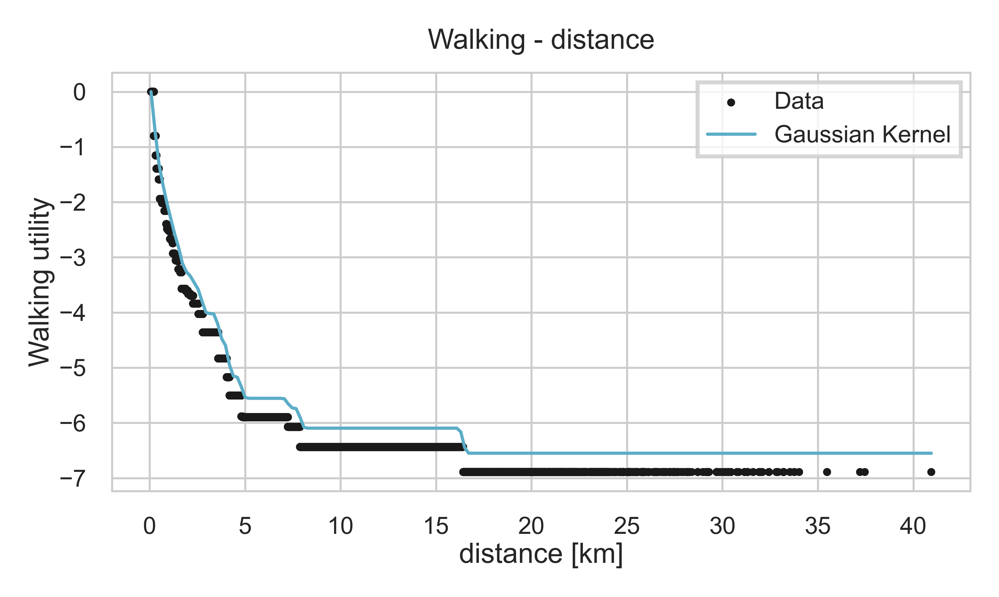

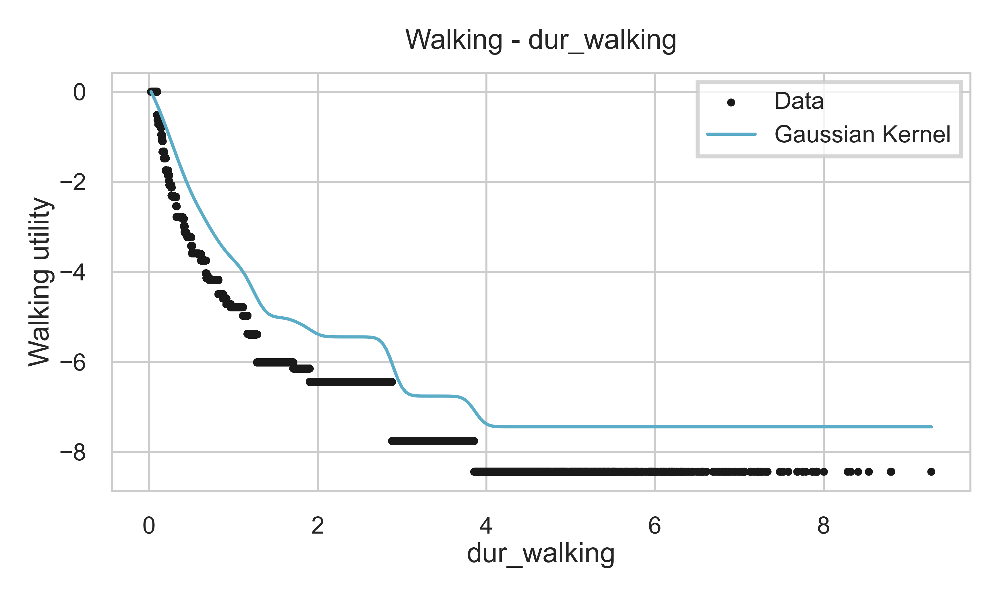

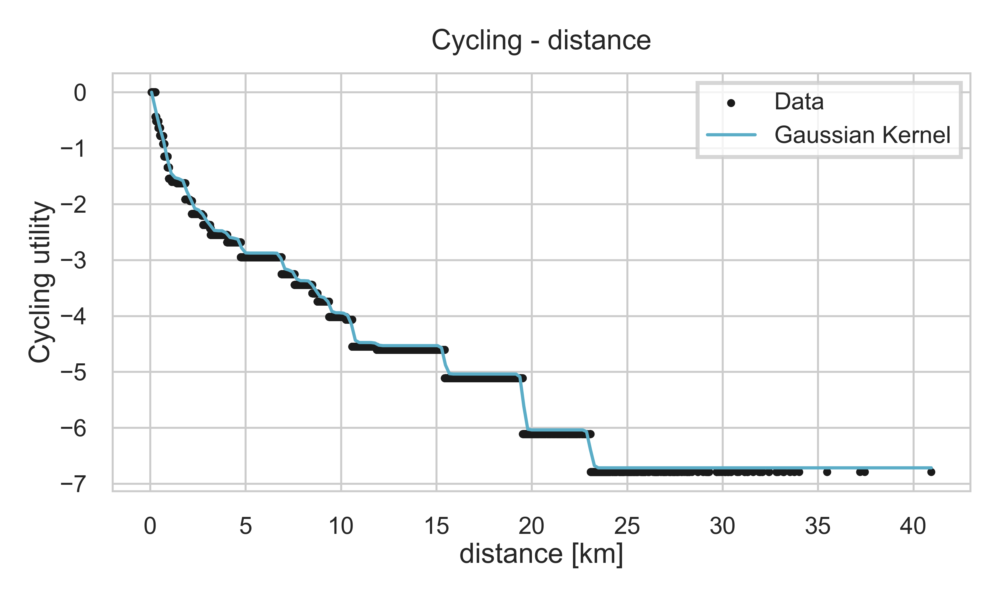

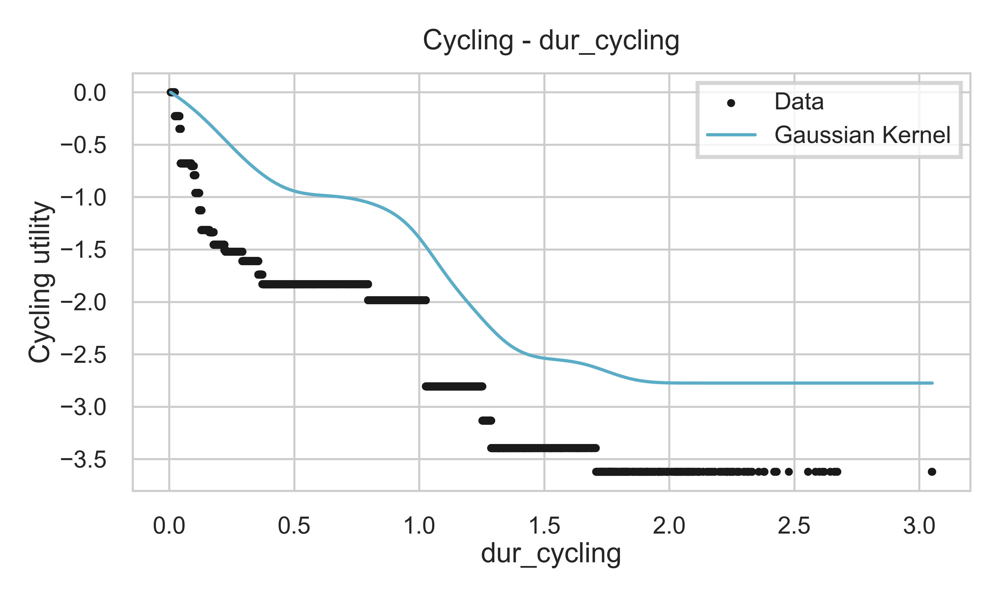

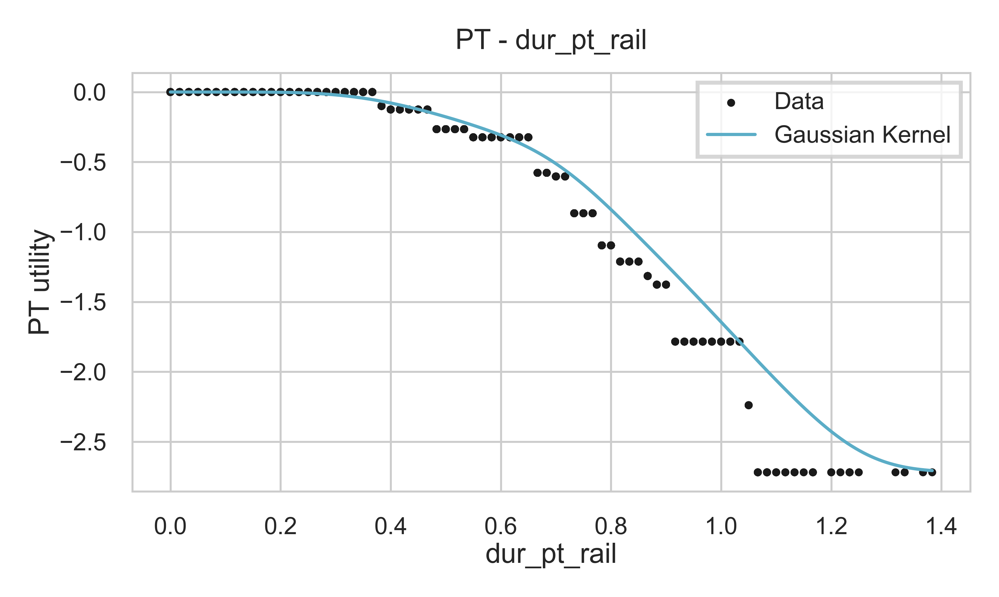

...

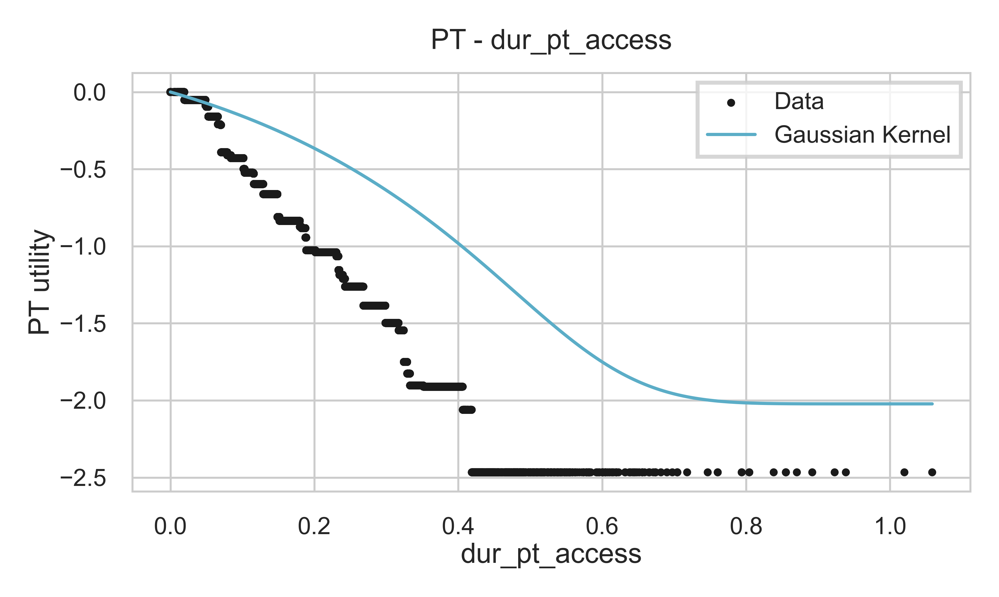

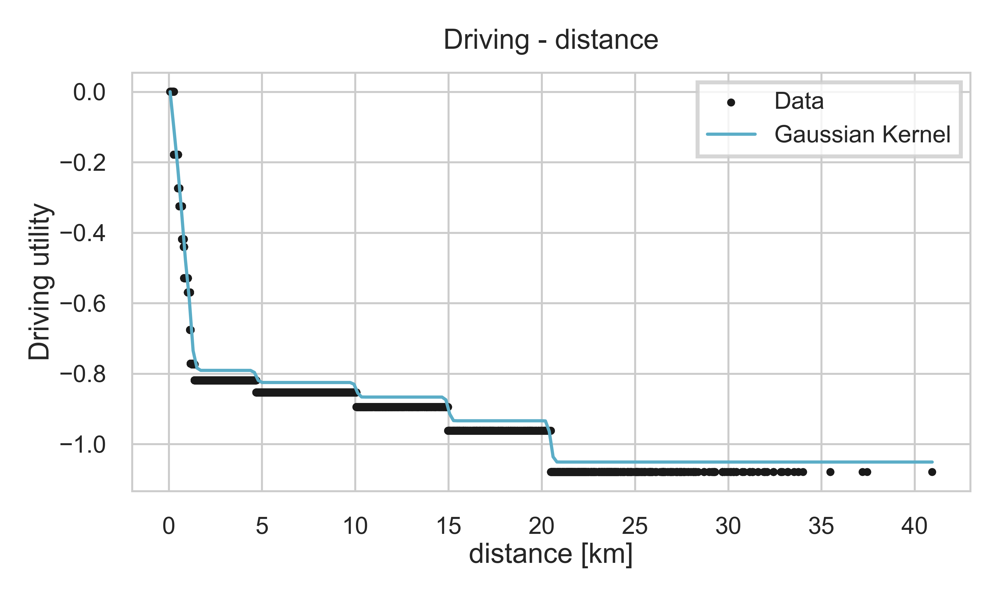

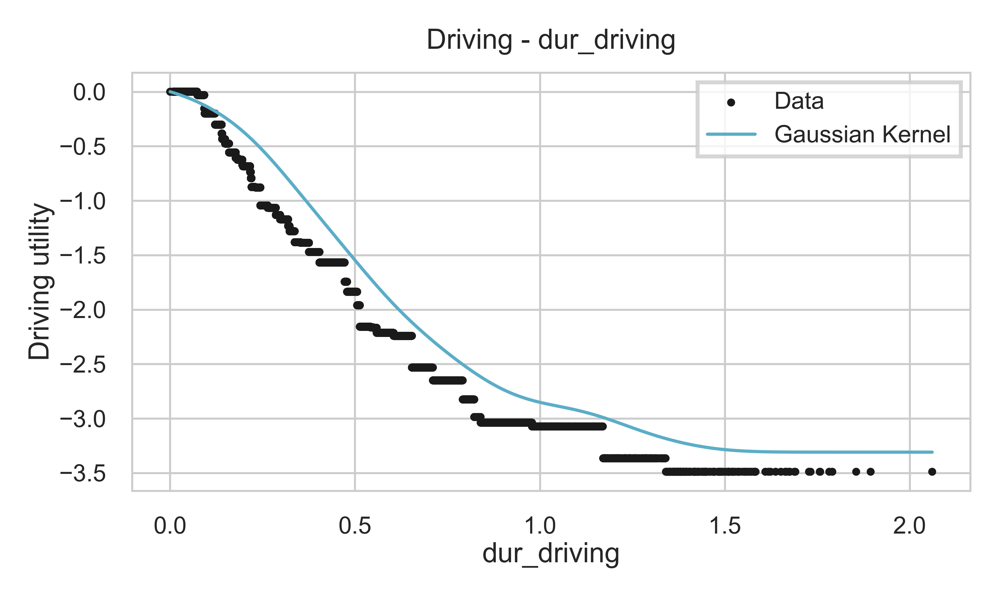

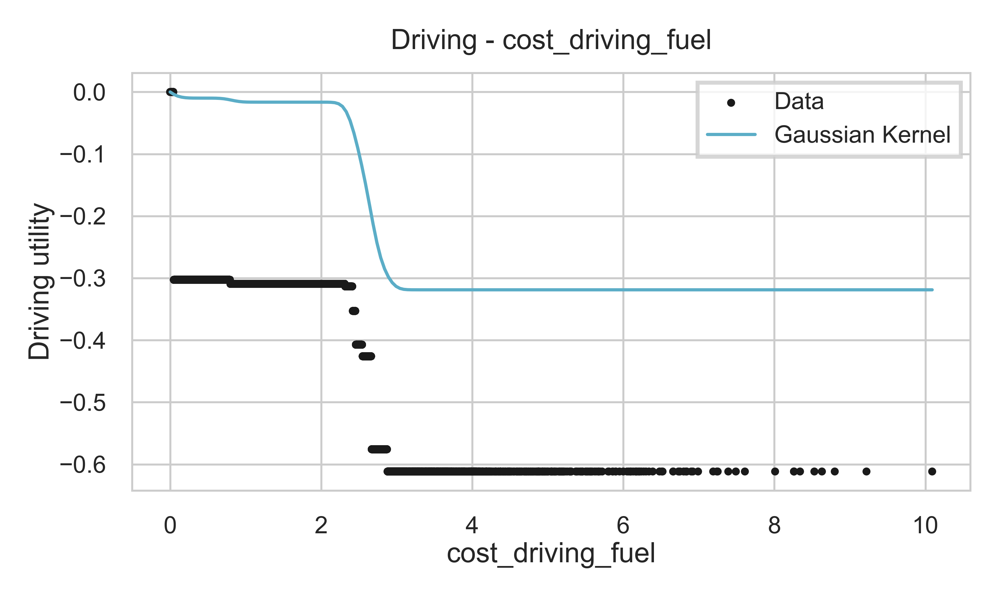

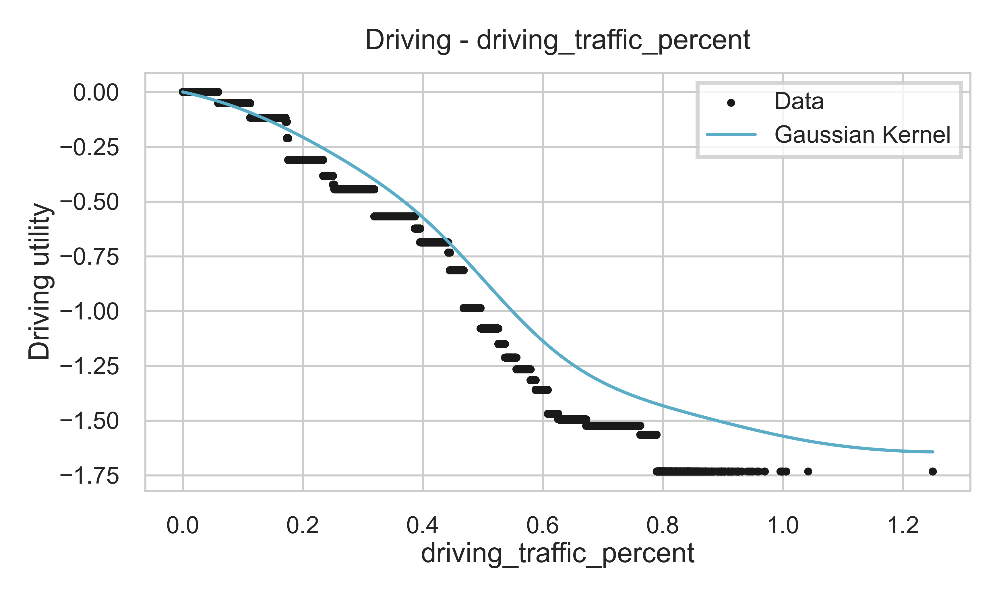

In [63]:
import sys
sys.path.append("../")
%load_ext autoreload
%autoreload 2

from rumboost.datasets import load_preprocess_LPMC
from rumboost.metrics import cross_entropy
from rumboost.utility_plotting import weights_to_plot_v2
from rumboost.utility_smoothing import smooth_predict
from rumboost.L_gaussian_kernel import gaussian_kernel_smoother, plot_gaussian_smoothing
import numpy as np

# Define universal parameters for Gaussian kernel smoothing
BANDWIDTH = 0.102884985752211
USE_FIRST_ENDPOINT_WEIGHTING = False
FIRST_ENDPOINT_WEIGHT = 0   # For example, replicate 2% of the points at the beginning
USE_LAST_ENDPOINT_WEIGHTING = False
LAST_ENDPOINT_WEIGHT = 3   # For example, replicate 2% of the points at the end

# --- Load Dataset and Model Weights ---
LPMC_train, LPMC_test, _ = load_preprocess_LPMC(path="../Data/")
# Assume LPMC_model_fully_trained is already defined (trained model)
weights = weights_to_plot_v2(LPMC_model_fully_trained)

# --- Define Features for Smoothing ---
smoothing_utilities = {
    '0': ['distance', 'dur_walking'],
    '1': ['distance', 'dur_cycling'],
    '2': ['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 
          'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'],
    '3': ['distance', 'dur_driving', 'cost_driving_fuel', 'driving_traffic_percent']
}

# --- Build Gaussian Kernel Utility Collection ---
util_collection = {}
for u in smoothing_utilities:
    util_collection[u] = {}
    for var in smoothing_utilities[u]:
        try:
            # Extract raw "black dot" data using data_leaf_value
            x_data, y_data = np.array(data_leaf_value(LPMC_train[var], weights[u][var], "data_weighted"))
        except Exception as e:
            print(f"Skipping {var} for utility {u}: {e}")
            continue
        if len(x_data) < 3:
            print(f"Skipping {var} for utility {u}: Not enough data points")
            continue
        
        # Apply Gaussian kernel smoothing with universal parameters and separate endpoint toggles
        util_collection[u][var] = gaussian_kernel_smoother(
            x_data, y_data,
            bandwidth=BANDWIDTH,
            use_first_endpoint_weighting=USE_FIRST_ENDPOINT_WEIGHTING,
            first_endpoint_weight=FIRST_ENDPOINT_WEIGHT,
            use_last_endpoint_weighting=USE_LAST_ENDPOINT_WEIGHTING,
            last_endpoint_weight=LAST_ENDPOINT_WEIGHT
        )
        
print("Gaussian Kernel smoothing applied.")

# --- Generate Predictions and Evaluate Performance ---
y_pred = smooth_predict(LPMC_test, util_collection)
CE_final = cross_entropy(y_pred, LPMC_test['choice'])
print(f"Smoothed final cross entropy loss (Gaussian Kernel): {CE_final}")

# --- Plot the Smoothed Utility Functions ---
utility_names = {'0': 'Walking', '1': 'Cycling', '2': 'PT', '3': 'Driving'}
plot_gaussian_smoothing(util_collection, utility_names, LPMC_train, weights, bandwidth=BANDWIDTH)


## H
100%|██████████| 100/100 [05:08<00:00,  3.08s/trial, best loss: 0.9860366454880884]
Best Gaussian Kernel parameters: {'bandwidth': 0.10288498575221106, 'endpoint_weight': 0.052569926661719196}

100%|██████████| 100/100 [06:08<00:00,  3.69s/trial, best loss: 0.9691534921082463]
Best Gaussian Kernel parameters: {'bandwidth': 0.023625959684236572, 'endpoint_weight': 0.23990151196893353}

100%|██████████| 100/100 [03:49<00:00,  2.30s/trial, best loss: 1.0705404364391606]
Best Gaussian Kernel parameters: {'bandwidth': 0.40032120533207055, 'first_endpoint_weight': 0.08864856390713224, 'last_endpoint_weight': 0.07021017414238154}

100%|██████████| 100/100 [03:52<00:00,  2.32s/trial, best loss: 1.0478746562113055]
Best Gaussian Kernel parameters: {'bandwidth': 0.30211913156626397, 'first_endpoint_weight': 0.0825001722760488, 'last_endpoint_weight': 0.2425553769627381}

In [ ]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import numpy as np
from rumboost.utility_smoothing import smooth_predict, data_leaf_value
from rumboost.metrics import cross_entropy
from rumboost.utility_plotting import weights_to_plot_v2
from rumboost.L_gaussian_kernel import gaussian_kernel_smoother

# Define the parameter search space
param_space = {
    'bandwidth': hp.uniform('bandwidth', 0.3, 1.0),
    'first_endpoint_weight': hp.uniform('first_endpoint_weight', 0.0, 0.1),
    'last_endpoint_weight': hp.uniform('last_endpoint_weight', 0.2, 0.5)
}

def gaussian_kernel_objective(params):
    bandwidth = params['bandwidth']
    first_endpoint_weight = params['first_endpoint_weight']
    last_endpoint_weight = params['last_endpoint_weight']
    
    # Build the utility collection using candidate parameters.
    util_collection = {}
    smoothing_utilities = {
        '0': ['distance', 'dur_walking'],
        '1': ['distance', 'dur_cycling'],
        '2': ['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 
              'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'],
        '3': ['distance', 'dur_driving', 'cost_driving_fuel', 'driving_traffic_percent']
    }
    
    for u in smoothing_utilities:
        util_collection[u] = {}
        for var in smoothing_utilities[u]:
            try:
                # Retrieve raw "black dot" data using data_leaf_value
                x_data, y_data = np.array(data_leaf_value(LPMC_train[var], weights[u][var], "data_weighted"))
            except Exception as e:
                continue
            if len(x_data) < 3:
                continue
            # Build the Gaussian kernel smoother with current parameters.
            util_collection[u][var] = gaussian_kernel_smoother(
                x_data, y_data,
                bandwidth=bandwidth,
                use_first_endpoint_weighting=True,
                first_endpoint_weight=first_endpoint_weight,
                use_last_endpoint_weighting=True,
                last_endpoint_weight=last_endpoint_weight
            )
    
    # Generate predictions on test set using the built utility collection.
    y_pred = smooth_predict(LPMC_test, util_collection)
    # Compute cross entropy loss on the test set.
    ce_loss = cross_entropy(y_pred, LPMC_test['choice'])
    return {'loss': ce_loss, 'status': STATUS_OK}

# Run Hyperopt optimization
trials = Trials()
best_params = fmin(
    fn=gaussian_kernel_objective,
    space=param_space,
    algo=tpe.suggest,
    max_evals=100,  # Adjust number of evaluations as needed
    trials=trials
)

print("Best Gaussian Kernel parameters:", best_params)


100%|██████████| 100/100 [03:52<00:00,  2.32s/trial, best loss: 1.0478746562113055]
Best Gaussian Kernel parameters: {'bandwidth': 0.30211913156626397, 'first_endpoint_weight': 0.0825001722760488, 'last_endpoint_weight': 0.2425553769627381}


In [ ]:
from sklearn.metrics import log_loss
import numpy as np

# Universal Evaluation Block
# Required inputs: 
# - y_pred: predicted probabilities (n_samples, n_alternatives)
# - LPMC_test["choice"]: true labels
# - CE_final: already-computed Cross-Entropy Loss for the current method

y_true = LPMC_test["choice"].values
N = len(y_true)

# Cross Entropy Loss (already computed as CE_final)
CEL = CE_final

# Log-Likelihood = -CEL * N
log_likelihood = -CEL * N

# 0–1 Accuracy: proportion of correctly predicted top-choice labels
pred_labels = np.argmax(y_pred, axis=1)
accuracy_01 = np.mean(pred_labels == y_true)

# Top-1 Max Probability: average max probability per observation
top1_max_prob = np.mean(np.max(y_pred, axis=1))

# Output
print("Total LPMC size:", len(LPMC_train) + len(LPMC_test))
print("Evaluation Metrics")
print(f"Number of observations (N): {N}")
print(f"Cross-Entropy Loss (CEL): {CEL:.4f}")
print(f"Log-Likelihood: {log_likelihood:.2f}")
print(f"0-1 Accuracy: {accuracy_01:.4f}")
print(f"Top-1 Max Probability: {top1_max_prob:.4f}")


Total LPMC size: 81086
Evaluation Metrics
Number of observations (N): 26320
Cross-Entropy Loss (CEL): 0.9860
Log-Likelihood: -25950.58
0-1 Accuracy: 0.6066
Top-1 Max Probability: 0.5248


# I-Spline Smoothing (Monotonic Spline Regression)

I-Spline Smoother Settings:
  Number of knots: 12
  Spline degree: 3
  Endpoint weight: 20
  Knot strategy: uniform
  Debug mode: False
Using file: /Users/leovilardo/rumboost/examples/../rumboost/L_ispline.py
L_ispline version: L_ispline v_corrected_1.0
[OK] Processed distance for utility 0
[OK] Processed dur_walking for utility 0
[OK] Processed distance for utility 1
[OK] Processed dur_cycling for utility 1
[OK] Processed dur_pt_rail for utility 2
[OK] Processed dur_pt_bus for utility 2
[OK] Processed cost_transit for utility 2
[OK] Processed dur_pt_int_waiting for utility 2
[OK] Processed dur_pt_int_walking for utility 2
[OK] Processed dur_pt_access for utility 2
[OK] Processed distance for utility 3
[OK] Processed dur_driving for utility 3
[OK] Processed cost_driving_fuel for utility 3
[OK] Processed driving_traffic_percent for utility 3
I-Spline smoothing applied.
Smoothed final cross entropy loss (I-Splines, clamped): 0.96460


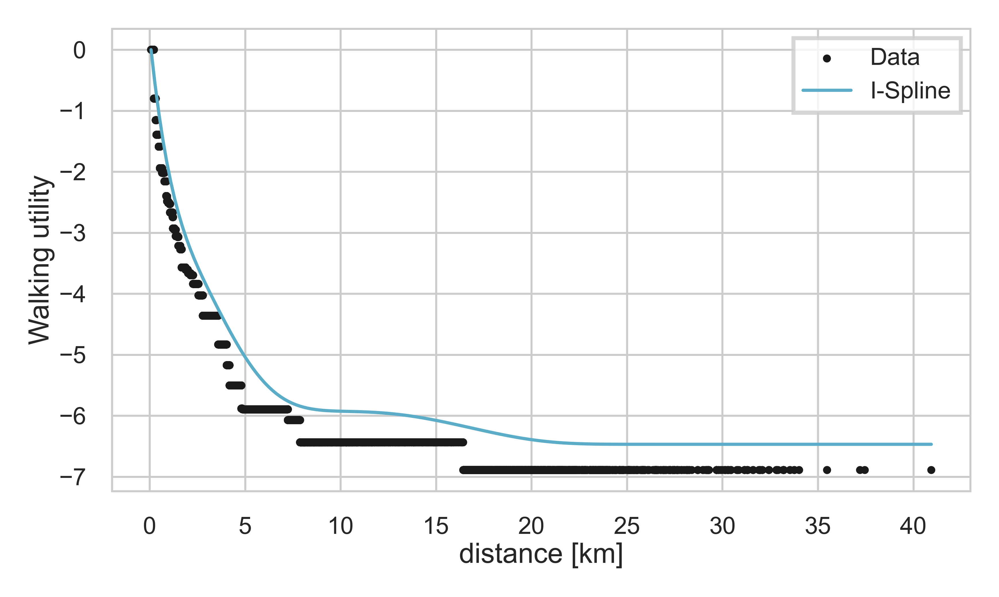

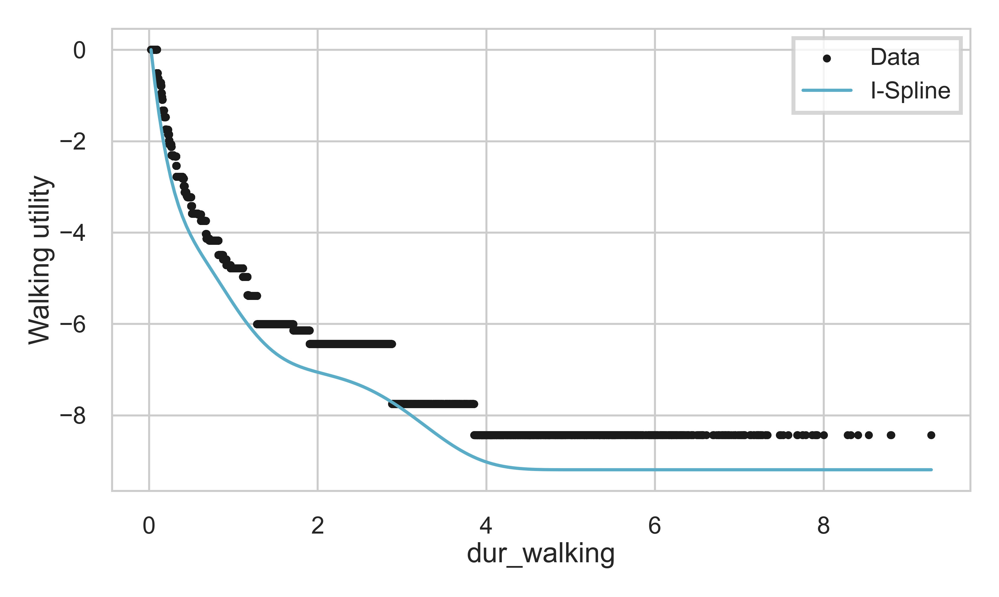

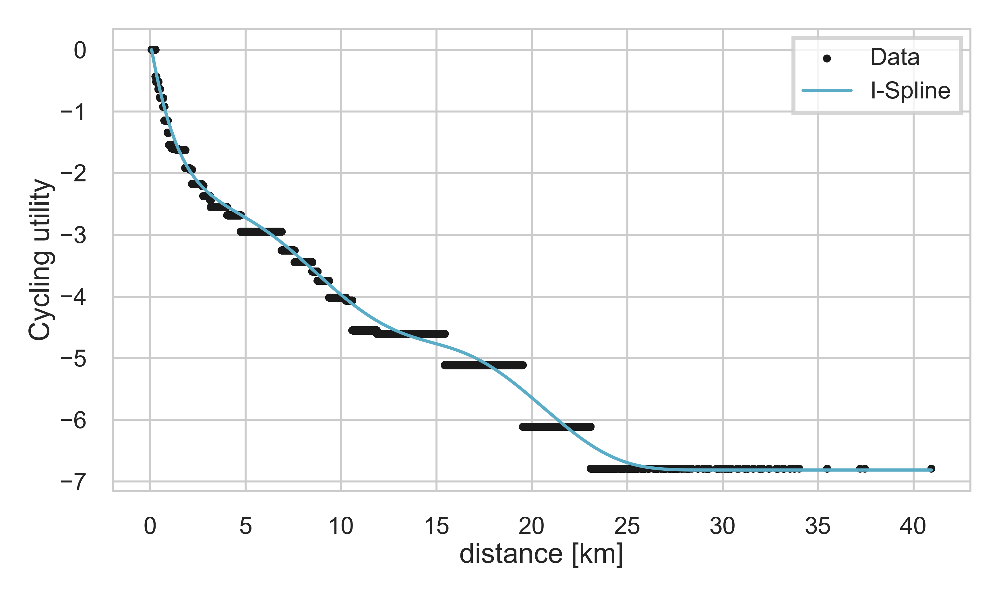

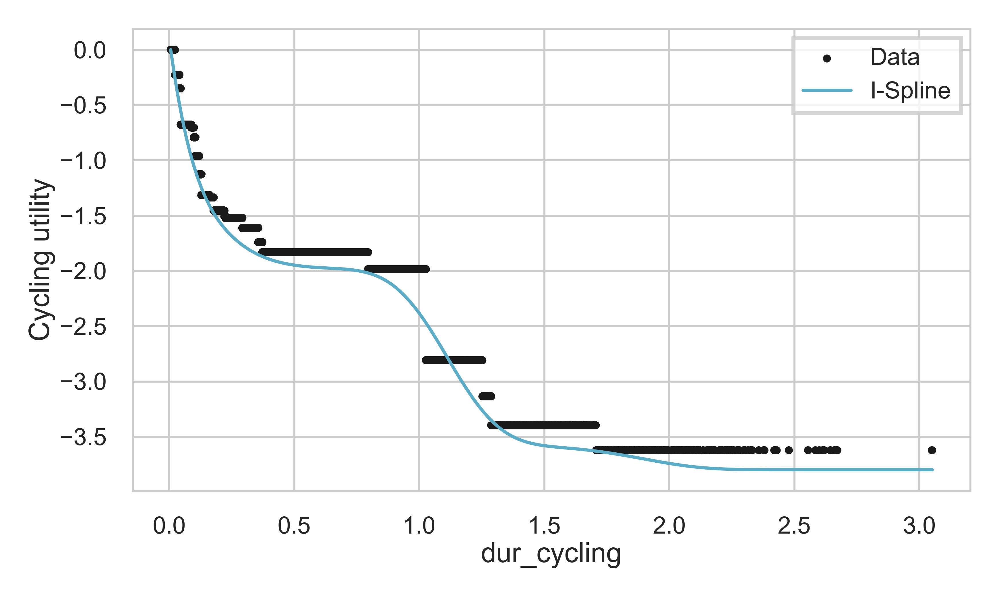

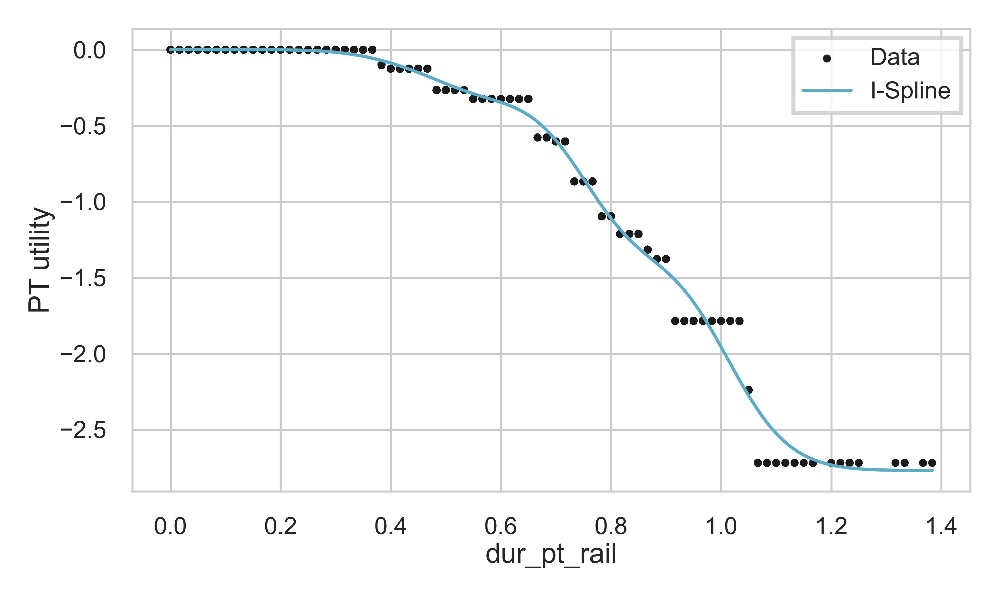

...

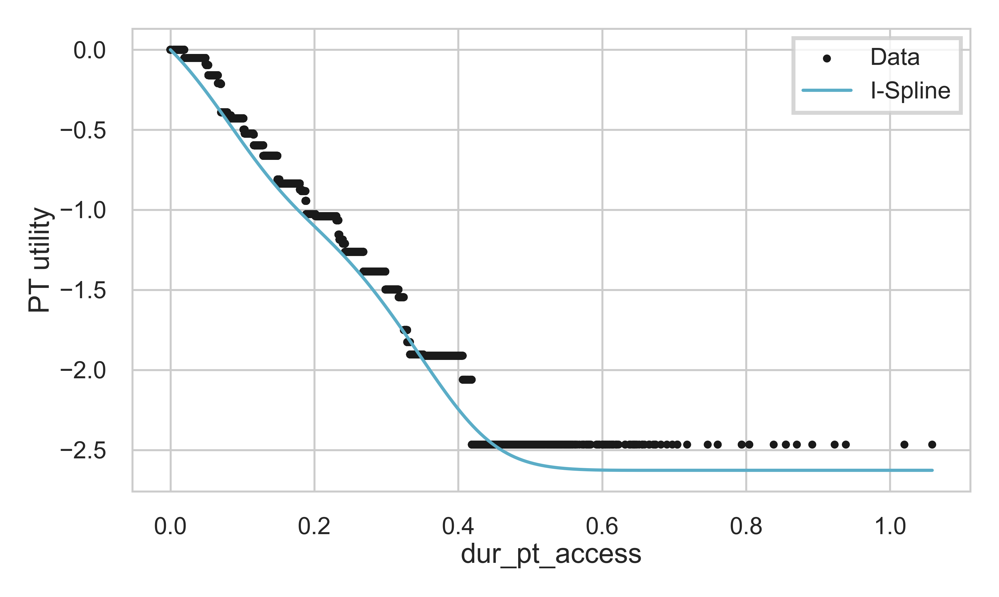

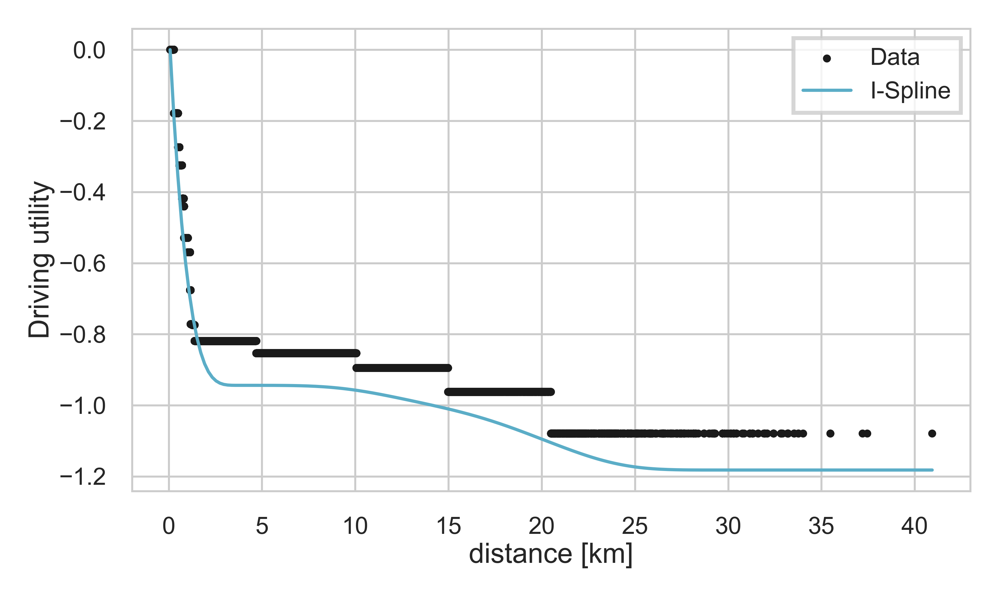

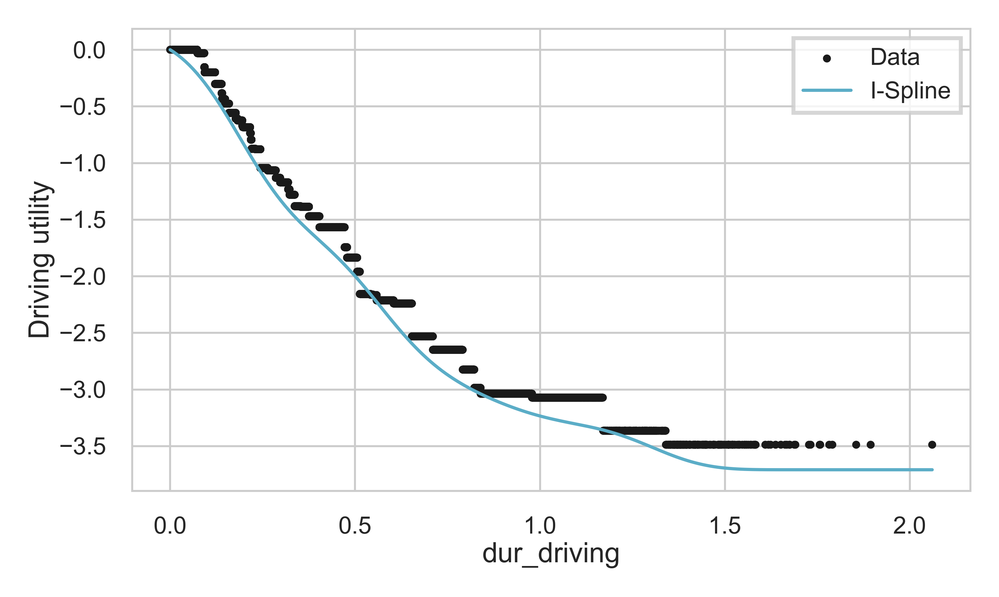

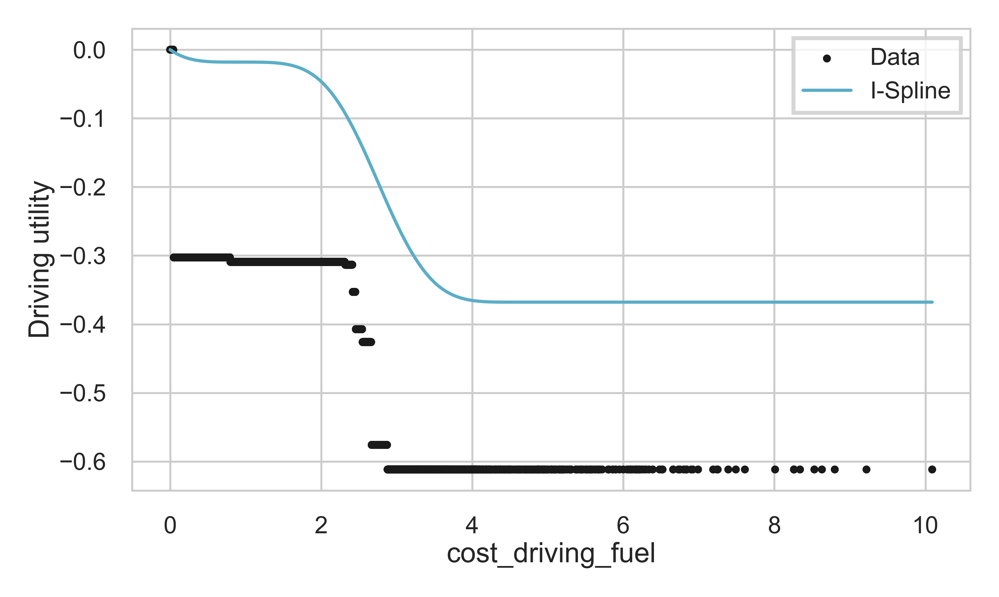

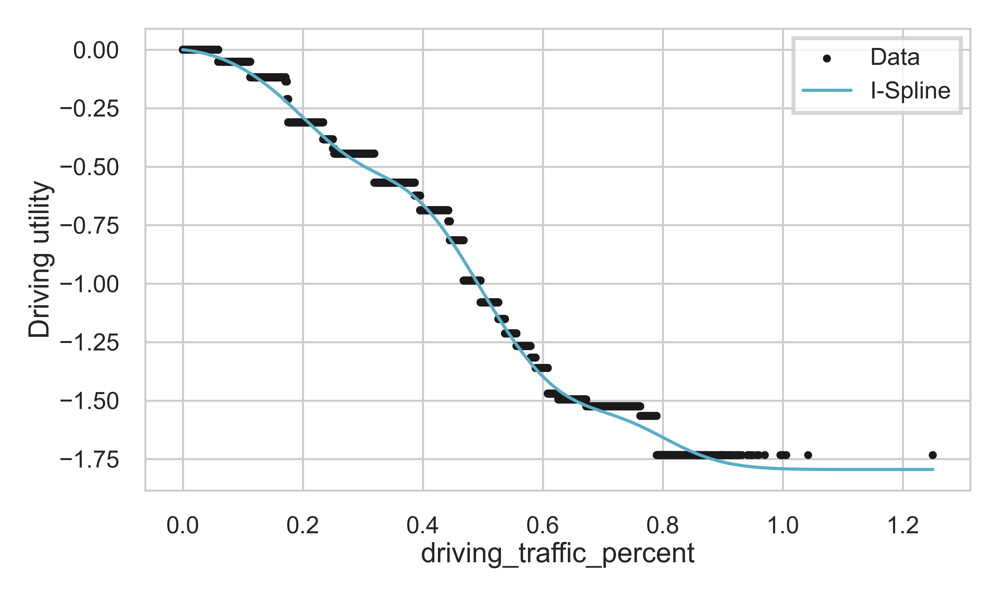

In [126]:
# --- GLOBAL ISPLINE SMOOTHER SETTINGS ---
NUM_KNOTS = 12      # We generate these externally (quantiles or uniform).
SPLINE_DEGREE = 3      # Cubic splines by default
ENDPOINT_WEIGHT = 20  # Weight for soft endpoint matching
KNOT_STRATEGY = "uniform"  # "quantile" or "uniform"
DEBUG_MODE = False      # Toggle debugging

print("I-Spline Smoother Settings:")
print(f"  Number of knots: {NUM_KNOTS}")
print(f"  Spline degree: {SPLINE_DEGREE}")
print(f"  Endpoint weight: {ENDPOINT_WEIGHT}")
print(f"  Knot strategy: {KNOT_STRATEGY}")
print(f"  Debug mode: {DEBUG_MODE}")

import sys, importlib, inspect
sys.path.append("../")

import rumboost.L_ispline as ispline_module
importlib.reload(ispline_module)
print("Using file:", inspect.getfile(ispline_module))
print("L_ispline version:", getattr(ispline_module, '__version__', 'No __version__ defined'))

# Import the functions
i_spline_smoother_decreasing = ispline_module.i_spline_smoother_decreasing
plot_ispline_smoothing = ispline_module.plot_ispline_smoothing

# Load Data and Weights
from rumboost.datasets import load_preprocess_LPMC
from rumboost.metrics import cross_entropy
from rumboost.utility_plotting import weights_to_plot_v2

# -----------------------
# 1) We'll clamp inside smooth_predict:
# -----------------------
from rumboost.utility_smoothing import smooth_predict as original_smooth_predict
import numpy as np

def smooth_predict_clamped(data_test, util_collection):
    """
    Same as your original smooth_predict, but we clamp the raw utilities
    to avoid infinite cross-entropy or numerical blow-ups.
    """
    # Use the original function to get raw predictions
    raw_preds = original_smooth_predict(data_test, util_collection, utilities=True)

    # Clamp the utilities to a safe range, e.g. [-10, 10].
    # You can adjust these bounds as needed.
    raw_preds = np.clip(raw_preds, -10, 10)

    # Now convert to probabilities via softmax
    # (We replicate the logic in your original function.)
    # If your original 'smooth_predict' does other advanced steps, replicate them here:
    from scipy.special import softmax
    preds = softmax(raw_preds, axis=1)
    return preds

LPMC_train, LPMC_test, _ = load_preprocess_LPMC(path="../Data/")
# We assume LPMC_model_fully_trained is defined in your environment.
weights = weights_to_plot_v2(LPMC_model_fully_trained)

# Which features to smooth
spline_utilities = {
    '0': ['distance', 'dur_walking'],
    '1': ['distance', 'dur_cycling'],
    '2': ['dur_pt_rail', 'dur_pt_bus', 'cost_transit',
          'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'],
    '3': ['distance', 'dur_driving', 'cost_driving_fuel', 'driving_traffic_percent']
}

# Fit an I-Spline Smoother for each feature
util_collection = {}
for u in spline_utilities:
    util_collection[u] = {}
    for var in spline_utilities[u]:
        try:
            x_data, y_data = data_leaf_value(LPMC_train[var], weights[u][var], "data_weighted")
            if len(x_data) < 3:
                print(f"[SKIP] {var} for utility {u}: not enough data points.")
                continue

            # Generate knots
            if KNOT_STRATEGY == "quantile":
                knots = np.quantile(x_data, np.linspace(0, 1, NUM_KNOTS))
            else:
                knots = np.linspace(np.min(x_data), np.max(x_data), NUM_KNOTS)

            knots[0] = np.min(x_data)
            knots[-1] = np.max(x_data)
            knots = np.unique(knots)
            knots = np.sort(knots)
            if len(knots) < SPLINE_DEGREE + 1:
                print(f"[SKIP] {var} for utility {u}: too few unique knots after cleanup.")
                continue

            smoother, final_knots = i_spline_smoother_decreasing(
                x_data, y_data,
                knots=knots,
                degree=SPLINE_DEGREE,
                endpoint_weight=ENDPOINT_WEIGHT,
                enforce_monotonicity=True,
                debug=DEBUG_MODE
            )
            util_collection[u][var] = smoother
            print(f"[OK] Processed {var} for utility {u}")

        except Exception as e:
            print(f"[ERROR] {var} for utility {u}: {e}")


print("I-Spline smoothing applied.")

# Evaluate CE with clamped predictions
y_pred = smooth_predict_clamped(LPMC_test, util_collection)
CE_final = cross_entropy(y_pred, LPMC_test['choice'])
print(f"Smoothed final cross entropy loss (I-Splines, clamped): {CE_final:.5f}")

# Plot
utility_names = {'0': 'Walking', '1': 'Cycling', '2': 'PT', '3': 'Driving'}
plot_ispline_smoothing(util_collection, utility_names, LPMC_train, weights)


[OK] Processed distance for utility 0 with 10 knots   
[OK] Processed dur_walking for utility 0 with 6 knots 
[OK] Processed distance for utility 1 with 8 knots    
[SKIP] dur_cycling for utility 1: too few unique knots after cleanup.
[OK] Processed dur_pt_rail for utility 2 with 11 knots
[OK] Processed dur_pt_bus for utility 2 with 4 knots  
[OK] Processed cost_transit for utility 2 with 9 knots
[SKIP] dur_pt_int_waiting for utility 2: too few unique knots after cleanup.
[OK] Processed dur_pt_int_walking for utility 2 with 8 knots
[OK] Processed dur_pt_access for utility 2 with 4 knots
[SKIP] distance for utility 3: too few unique knots after cleanup.
[OK] Processed dur_driving for utility 3 with 8 knots 
[OK] Processed cost_driving_fuel for utility 3 with 7 knots
[OK] Processed driving_traffic_percent for utility 3 with 6 knots
Cross-entropy loss: 1.0297                            
[OK] Processed distance for utility 0 with 10 knots                             
[OK] Processed dur_wal

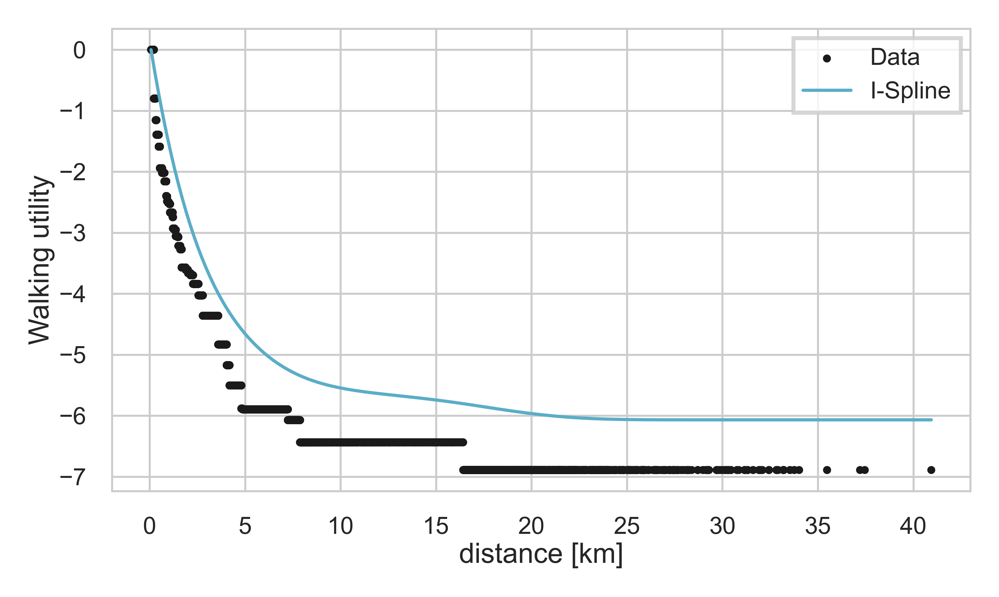

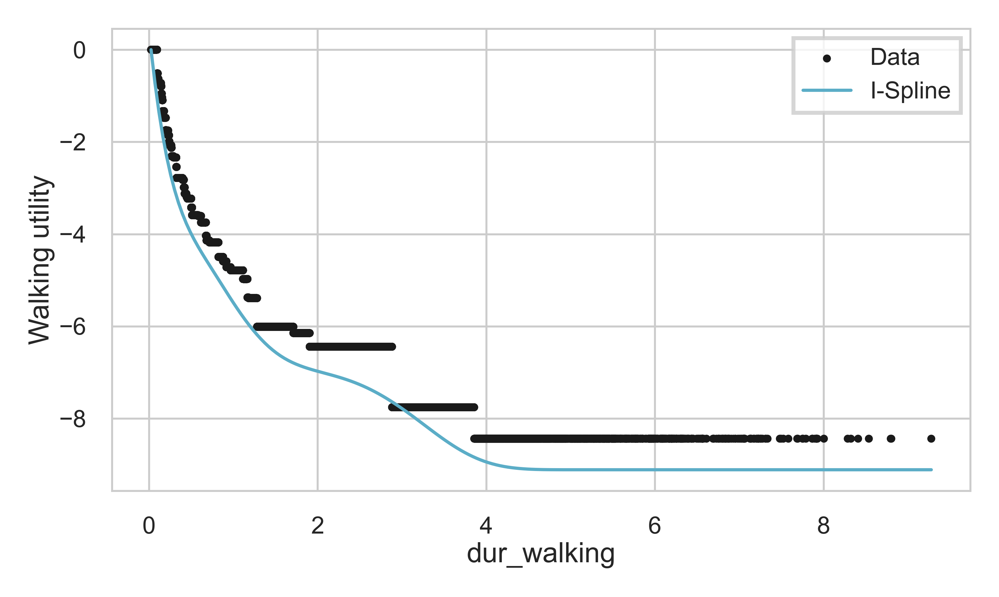

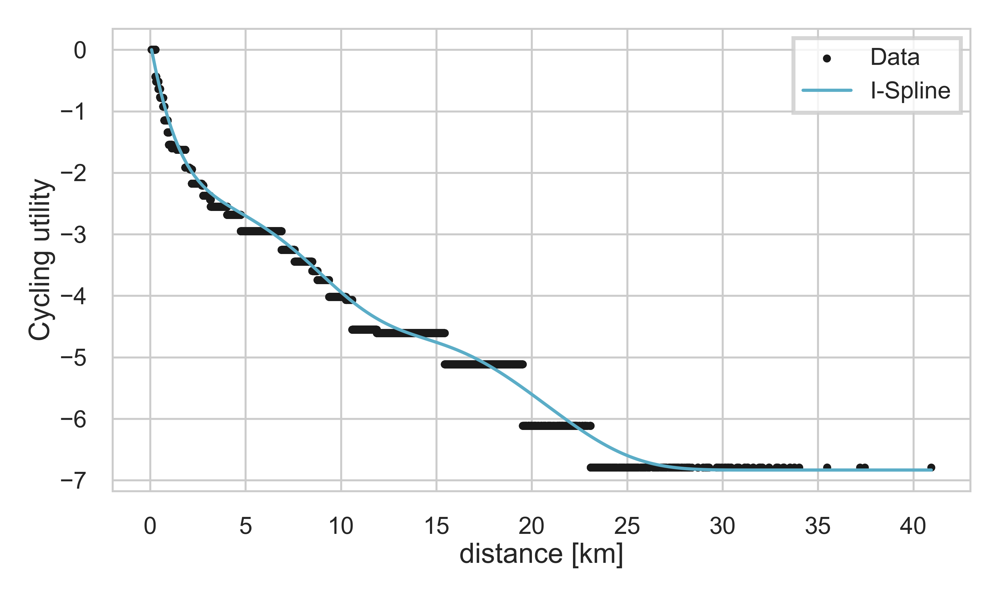

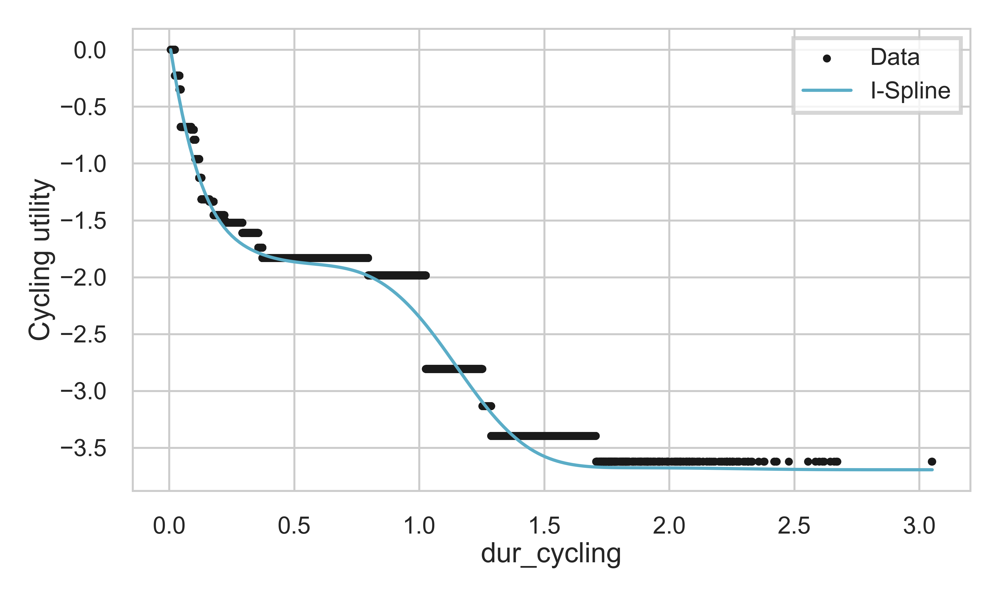

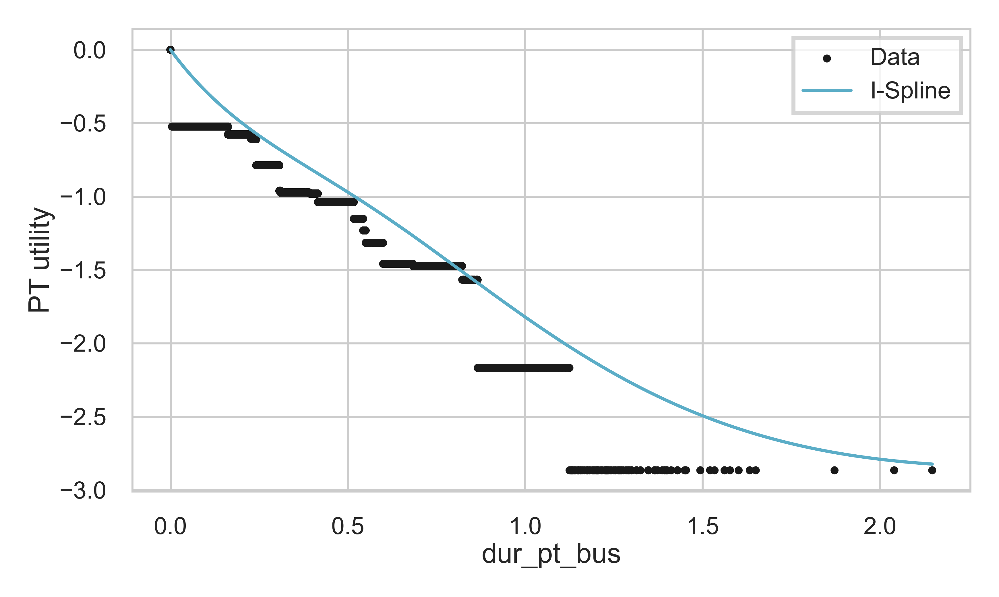

...

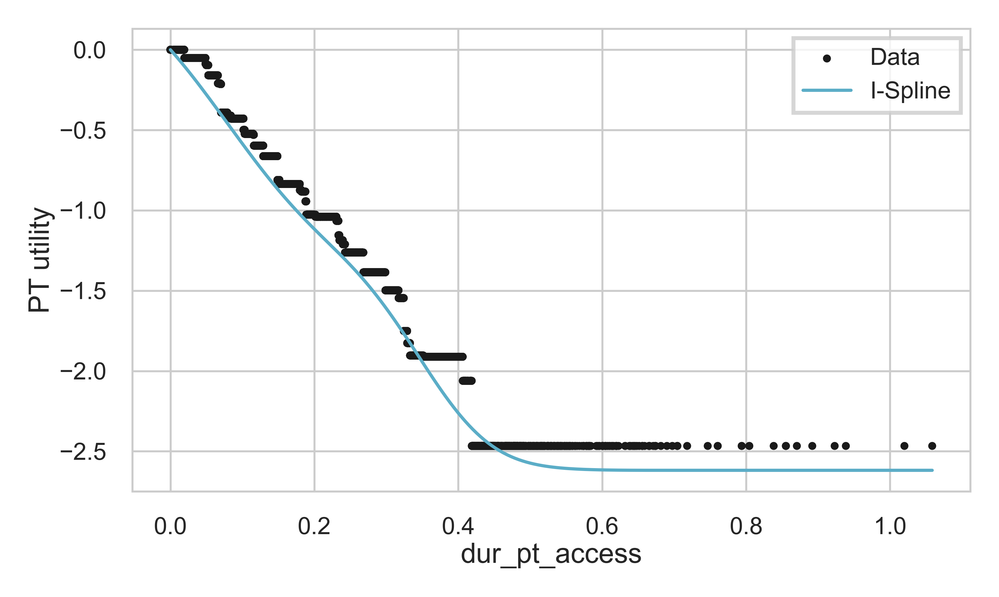

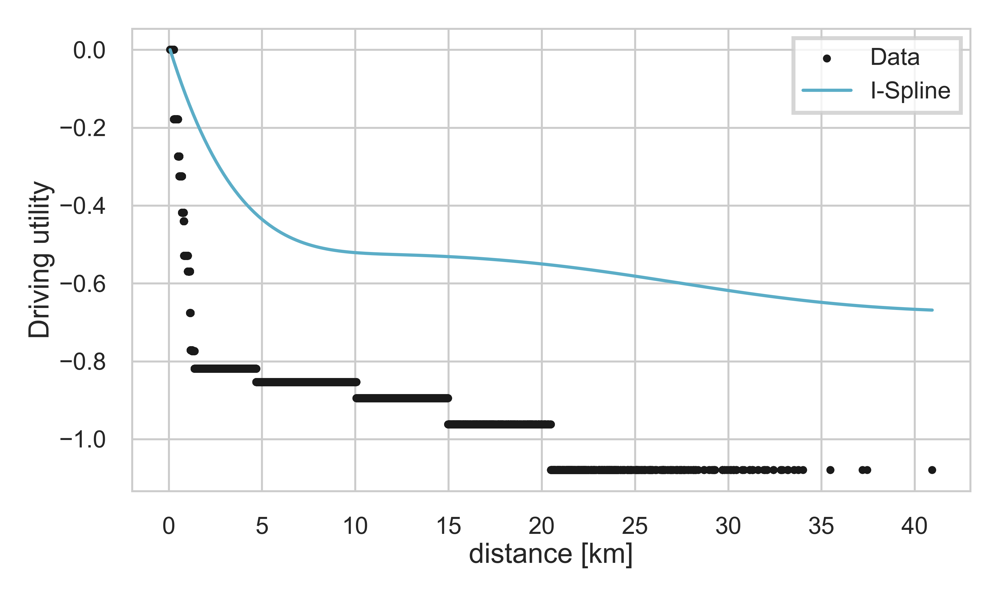

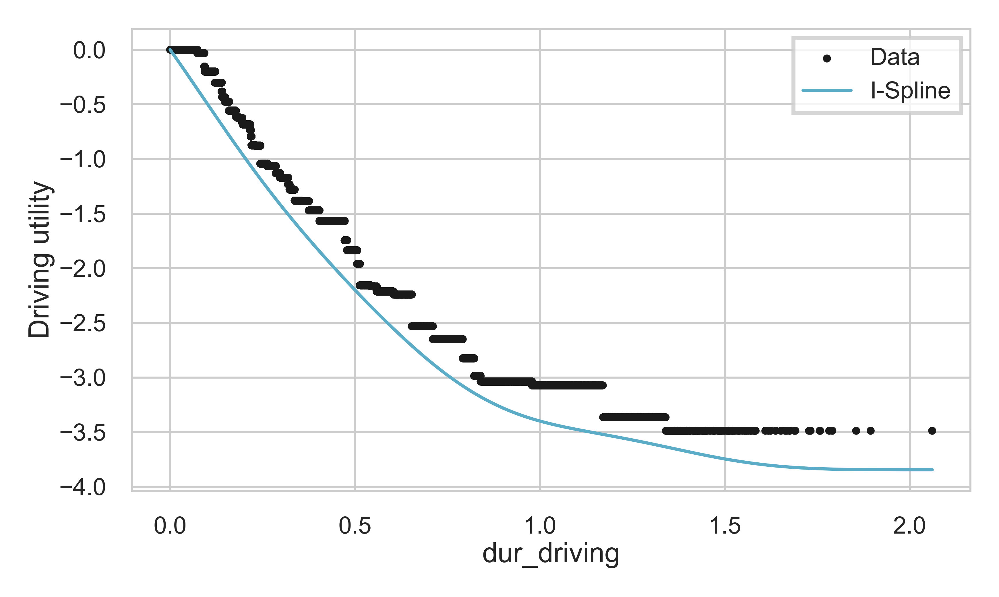

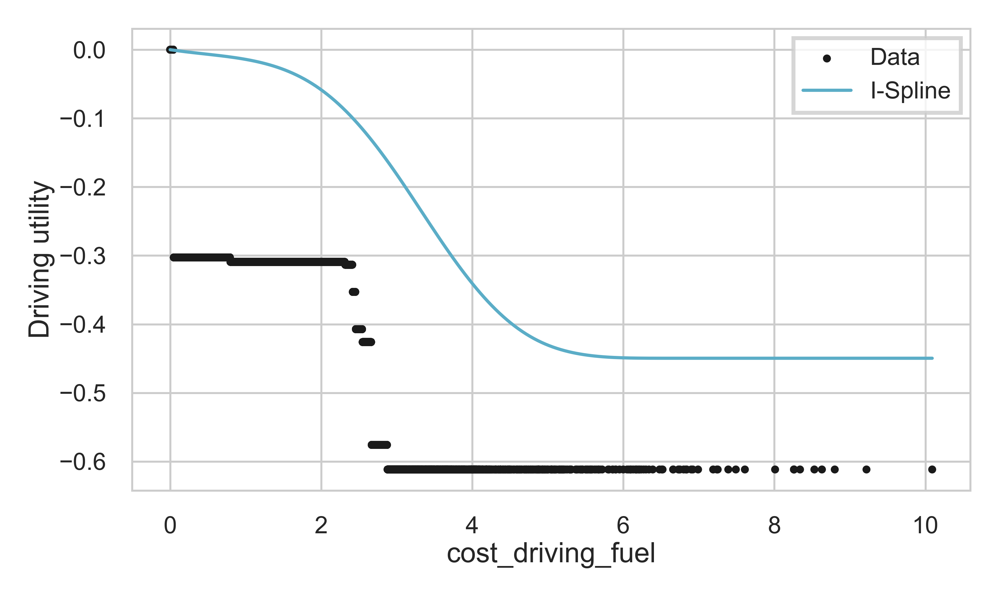

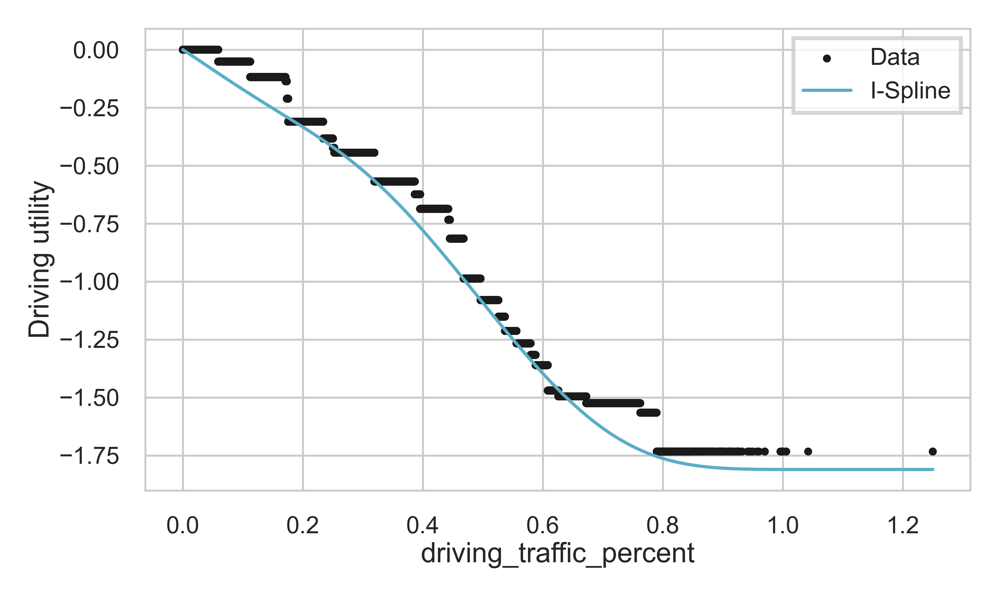

In [138]:
# Import necessary libraries
import numpy as np
import hyperopt
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from rumboost.datasets import load_preprocess_LPMC
from rumboost.metrics import cross_entropy
from rumboost.utility_smoothing import smooth_predict
from rumboost.utility_plotting import weights_to_plot_v2

# Define the parameter space for number of knots
param_space = {
    '0': {
        'distance': hyperopt.pyll.scope.int(hp.quniform('distance_0', 2, 12, 1)),
        'dur_walking': hyperopt.pyll.scope.int(hp.quniform('dur_walking_0', 2, 12, 1))
    },
    '1': {
        'distance': hyperopt.pyll.scope.int(hp.quniform('distance_1', 2, 12, 1)),
        'dur_cycling': hyperopt.pyll.scope.int(hp.quniform('dur_cycling_1', 2, 12, 1))
    },
    '2': {
        'cost_transit': hyperopt.pyll.scope.int(hp.quniform('cost_transit_2', 2, 12, 1)),
        'dur_pt_access': hyperopt.pyll.scope.int(hp.quniform('dur_pt_access_2', 2, 12, 1)),
        'dur_pt_bus': hyperopt.pyll.scope.int(hp.quniform('dur_pt_bus_2', 2, 12, 1)),
        'dur_pt_int_waiting': hyperopt.pyll.scope.int(hp.quniform('dur_pt_int_waiting_2', 2, 12, 1)),
        'dur_pt_int_walking': hyperopt.pyll.scope.int(hp.quniform('dur_pt_int_walking_2', 2, 12, 1)),
        'dur_pt_rail': hyperopt.pyll.scope.int(hp.quniform('dur_pt_rail_2', 2, 12, 1))
    },
    '3': {
        'cost_driving_fuel': hyperopt.pyll.scope.int(hp.quniform('cost_driving_fuel_3', 2, 12, 1)),
        'distance': hyperopt.pyll.scope.int(hp.quniform('distance_3', 2, 12, 1)),
        'driving_traffic_percent': hyperopt.pyll.scope.int(hp.quniform('driving_traffic_percent_3', 2, 12, 1)),
        'dur_driving': hyperopt.pyll.scope.int(hp.quniform('dur_driving_3', 2, 12, 1))
    }
}

# Features per utility
spline_utilities = {
    '0': ['distance', 'dur_walking'],
    '1': ['distance', 'dur_cycling'],
    '2': ['dur_pt_rail', 'dur_pt_bus', 'cost_transit', 'dur_pt_int_waiting', 'dur_pt_int_walking', 'dur_pt_access'],
    '3': ['distance', 'dur_driving', 'cost_driving_fuel', 'driving_traffic_percent']
}

# Define the objective function
def objective(space):
    global LPMC_train, LPMC_test, LPMC_model_fully_trained  # Use global variables from notebook
    
    weights = weights_to_plot_v2(LPMC_model_fully_trained)
    
    # Create I-Spline smoothers based on the hyperparameter space
    util_collection = {}
    
    for u in spline_utilities:
        util_collection[u] = {}
        for var in spline_utilities[u]:
            try:
                x_data, y_data = data_leaf_value(LPMC_train[var], weights[u][var], "data_weighted")
                if len(x_data) < 3:
                    print(f"[SKIP] {var} for utility {u}: not enough data points.")
                    continue
                
                # Generate knots based on hyperparameters
                num_knots = space[u][var]
                
                # Create uniform knots
                knots = np.linspace(np.min(x_data), np.max(x_data), num_knots)
                knots = np.unique(knots)  # Ensure uniqueness
                
                if len(knots) < 4:  # Need at least 4 knots for cubic splines
                    print(f"[SKIP] {var} for utility {u}: too few unique knots after cleanup.")
                    continue
                
                # Define default parameters (can be tuned in future iterations)
                degree = 3
                endpoint_weight = 150
                reg_param = 1e-4
                
                smoother, final_knots = i_spline_smoother_decreasing(
                    x_data, y_data,
                    knots=knots,
                    degree=degree,
                    endpoint_weight=endpoint_weight,
                    enforce_monotonicity=True,
                    debug=False
                )
                
                util_collection[u][var] = smoother
                print(f"[OK] Processed {var} for utility {u} with {num_knots} knots")
                
            except Exception as e:
                print(f"[ERROR] {var} for utility {u}: {e}")
    
    # Evaluate cross-entropy loss with clamped predictions
    try:
        y_pred = smooth_predict_clamped(LPMC_test, util_collection)
        CE_final = cross_entropy(y_pred, LPMC_test['choice'])
        print(f"Cross-entropy loss: {CE_final:.4f}")
        return {'loss': CE_final, 'status': STATUS_OK, 'util_collection': util_collection}
    except Exception as e:
        print(f"Error in evaluation: {e}")
        return {'loss': float('inf'), 'status': STATUS_OK}

# Same clamped prediction function as in your code
def smooth_predict_clamped(data_test, util_collection):
    """
    Same as your original smooth_predict, but we clamp the raw utilities
    to avoid infinite cross-entropy or numerical blow-ups.
    """
    # Use the original function to get raw predictions
    raw_preds = smooth_predict(data_test, util_collection, utilities=True)

    # Clamp the utilities to a safe range, e.g. [-10, 10]
    raw_preds = np.clip(raw_preds, -10, 10)

    # Convert to probabilities via softmax
    from scipy.special import softmax
    preds = softmax(raw_preds, axis=1)
    return preds

# Run the hyperparameter optimization
trials = Trials()
best = fmin(
    fn=objective,
    space=param_space,
    algo=tpe.suggest,
    max_evals=20,  # Number of iterations to run
    trials=trials
)

# Get the best parameters and results
best_loss = min([t['result']['loss'] for t in trials.trials if 'loss' in t['result']])
best_trial_idx = np.argmin([t['result']['loss'] for t in trials.trials if 'loss' in t['result']])
best_trial = trials.trials[best_trial_idx]
best_params = hyperopt.space_eval(param_space, best)

print("\n=== Best Hyperparameters ===")
print(f"Best Cross-Entropy Loss: {best_loss:.4f}")
print("Optimal number of knots per feature:")
print(f"endpoint weight: {endpoint_weight}")
for u in best_params:
    print(f"Utility {u}:")
    for var in best_params[u]:
        print(f"  {var}: {best_params[u][var]}")

# Optionally, save the best parameters to use later
import json
with open('best_ispline_knots.json', 'w') as f:
    json.dump(best_params, f, indent=2)

# Visualize the best results if needed
try:
    best_util_collection = best_trial['result']['util_collection']
    utility_names = {'0': 'Walking', '1': 'Cycling', '2': 'PT', '3': 'Driving'}
    plot_ispline_smoothing(best_util_collection, utility_names, LPMC_train, weights)
except:
    print("Visualization of best results not available")


# BASELINE CEL

In [66]:
np.log(0.25)

-1.3862943611198906

In [67]:
proportions = LPMC_test['choice'].value_counts(normalize=True)

proportions

choice
3    0.428343
2    0.360980
0    0.177964
1    0.032713
Name: proportion, dtype: float64

In [68]:
np.sum([p*np.log(p) for p in proportions])

-1.1500505568999915

In [69]:
from rumboost.utils import data_leaf_value

summary_stats = []

for utility_id, variables in selected_attributes.items():
    for var in variables:
        # Get GBUV (y-values) and x-values from the training set
        x_vals, y_vals = data_leaf_value(LPMC_train[var], weights[utility_id][var])

        # Sort for plotting / interpretation
        sorted_idx = np.argsort(x_vals)
        x_sorted = x_vals[sorted_idx]
        y_sorted = y_vals[sorted_idx]

        # Compute statistics
        n_points = len(x_sorted)
        n_unique_x = len(np.unique(x_sorted))
        n_unique_y = len(np.unique(y_sorted))
        x_range = (np.min(x_sorted), np.max(x_sorted))
        y_range = (np.min(y_sorted), np.max(y_sorted))

        summary_stats.append({
            "Utility": utility_names[utility_id],
            "Attribute": var,
            "X Range": x_range,
            "Y Range": y_range,
            "Total Points": n_points,
            "Unique X": n_unique_x,
            "Unique Y": n_unique_y
        })

# Display summary table
import pandas as pd

summary_df = pd.DataFrame(summary_stats)
display(summary_df)  # Use this in Jupyter or Colab
# Or: print(summary_df.head()) for a text version



NameError: name 'selected_attributes' is not defined